# clustering

> Fill in a module description here

In [ ]:
#| hide

%load_ext autoreload
%autoreload 2

from nbdev.showdoc import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
import math

import pandas as pd
from fastai.vision.all import *

from singleline_stroke3.embeddings import *
from singleline_stroke3.fileorg import *

In [ ]:
#| hide

""" this code was used to simulate new data getting added in a separate epoch"""

# prev_files = get_image_files(PREV_01_FLAT)

# prev_basenames = [os.path.basename(f) for f in prev_files]
# print(prev_basenames[:5])

# EXTERNAL_EPOCH = singleline_data_home(default='/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data') / f"raster/epoch-{PREV_EPOCH}"
# EXTERNAL_03_HAND = EXTERNAL_EPOCH / '03_VISUAL_HAND_LABELED'
# external_hand_labeled = get_image_files(EXTERNAL_03_HAND)

# import shutil

# for f in external_hand_labeled:
#     f_basename = os.path.basename(f)
#     f_dirname = os.path.dirname(f)
#     f_dirname_basename = os.path.basename(f_dirname)

#     if f_basename in prev_basenames:
#         new_dir = os.path.join(PREV_03_HAND, f_dirname_basename)
#         if not os.path.isdir(new_dir):
#             os.makedirs(new_dir)
#         shutil.copy(f, os.path.join(new_dir, f_basename))

' this code was used to simulate new data getting added in a separate epoch'

no env var SINGLELINE_DATA_HOME, defaulting to: None


## Predict embeddings on new dataset

In [ ]:
PREV_EPOCH = SketchbookEpoch(epoch='20231214', data_home='../data_home')
EPOCH = SketchbookEpoch(epoch='20231215', data_home='../data_home')

PREV_01_FLAT = PREV_EPOCH.dir_01_FLAT()
PREV_02_CATEGORIZED = PREV_EPOCH.dir_02_CATEGORIZED()
PREV_03_HAND = PREV_EPOCH.dir_03_HANDLABELED()

CURR_01_FLAT = PREV_EPOCH.dir_01_FLAT()
CURR_02_CATEGORIZED = PREV_EPOCH.dir_02_CATEGORIZED()
CURR_03_HAND = PREV_EPOCH.dir_03_HANDLABELED()

no env var SINGLELINE_DATA_HOME, defaulting to: None
no env var SINGLELINE_DATA_HOME, defaulting to: None


In [ ]:
# dir_to_embed = DATA_HOME / "raster/epoch-20231214/01_FLAT"
dir_to_embed = CURR_01_FLAT

path = Path(dir_to_embed)
files = get_image_files(path)
len(files)

batched_fnames, ordered_dls = batch_fnames_and_images(dir_to_embed)

total items: 246, num batches: 4


In [ ]:
learn = load_resnet(
    data_home=singleline_data_home('../data_home'),
    model_path=PRETRAINED_MODEL_PATH,
    model_checkpoint=PRETRAINED_CHECKPOINT,
)

learn.model[-1]

no env var SINGLELINE_DATA_HOME, defaulting to: None


Sequential(
  (0): AdaptiveConcatPool2d(
    (ap): AdaptiveAvgPool2d(output_size=1)
    (mp): AdaptiveMaxPool2d(output_size=1)
  )
  (1): fastai.layers.Flatten(full=False)
  (2): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): Dropout(p=0.25, inplace=False)
  (4): Linear(in_features=1024, out_features=512, bias=False)
  (5): ReLU(inplace=True)
  (6): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): Dropout(p=0.5, inplace=False)
  (8): Linear(in_features=512, out_features=5, bias=False)
)

In [ ]:
rows = []
for x in embed_dir(dir_to_embed, learn, strip_dir=DATA_HOME):
    rows.append(x)
df = pd.DataFrame(rows)
print(f"num rows: {len(df)}")
df.head()

total items: 246, num batches: 4
num rows: 246


,idx,indiv_fname,orig_fname,label,emb_csv
0,0,sb44p049.jpg,raster/epoch-20231214/01_FLAT/art/sb44p049.jpg,art,"0.91717315,-0.33151555,0.36988336,-0.6553513,0.086239696,-0.65341413,-0.4361802,-0.36238012,-0.7537334,-0.3031473,-0.48060724,-0.72562873,-0.565413,-0.09880668,-0.5475323,-0.04036683,0.44142503,-0.6520286,0.04167962,-0.6497359,-0.64108604,-0.55193967,-0.35955518,-0.6779002,0.077251196,-0.6690378,-0.4518578,0.21651912,1.7697747,-0.45211998,-0.68509877,-0.67007643,1.2833543,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,1.2479905,0.6476668,-0.61049384,-0.19099826,0.110162795,0.42599517,-0.75794554,-0.59257406,-0.116469175,-0.6001429,-0.651804,-0.07218614,0.051204205,-0.66552746,-0.6482..."
1,1,sb44p045.jpg,raster/epoch-20231214/01_FLAT/art/sb44p045.jpg,art,"2.8601866,1.1092956,-0.73929733,-0.6553513,0.5672202,-0.65341413,-0.5085346,1.248079,-0.7537334,-0.42715576,0.6454332,-0.72562873,0.41019952,-0.6266761,0.62295574,1.694821,-0.33249626,1.2614133,-0.6898426,-0.6497359,0.19355321,-0.55193967,-0.06255686,-0.6779002,0.99847466,-0.6690378,-0.4518578,-0.5982413,-0.73986673,-0.45211998,-0.68509877,-0.67007643,1.113896,-0.00015628338,-0.600525,-0.6186755,-0.73933,-0.13120255,-0.05207634,0.17374164,-0.61049384,1.7041025,2.4831877,-0.4865226,-0.75794554,-0.59257406,-0.6157326,-0.6001429,-0.651804,1.5503669,-0.19028461,-0.66552746,0.41275883,-0.360710..."
2,2,sb44p071.jpg,raster/epoch-20231214/01_FLAT/art/sb44p071.jpg,art,"1.1039282,0.40789557,-0.73929733,-0.21089229,0.2105155,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,-0.0032305121,-0.72562873,-0.662768,-0.6266761,-0.68991846,2.312447,-0.25798303,-0.61934,-0.6898426,-0.6497359,-0.64108604,-0.55193967,-0.16009846,-0.34828636,0.7935942,1.0889475,-0.4518578,0.39928132,-0.21712327,-0.45211998,-0.68509877,0.57344586,-0.06059304,-0.4592305,-0.600525,-0.6186755,0.74404234,-0.57338566,0.7415296,2.421186,0.29664278,-0.58021957,0.09785026,-0.6682474,-0.65389055,0.21219158,-0.44859287,-0.6001429,-0.651804,-0.43808222,-0.59497476,-0.105357945,-0.47372633,..."
3,3,sb45p006.jpg,raster/epoch-20231214/01_FLAT/art/sb45p006.jpg,art,"0.46896708,-0.49217787,-0.73929733,-0.37795725,-0.6254566,-0.65341413,2.0278618,-0.4896673,-0.7537334,-0.17529237,1.1320556,-0.72562873,-0.662768,-0.3608559,-0.39049083,1.5118157,-0.5467274,-0.6520286,0.17297399,-0.6497359,-0.09167153,-0.55193967,-0.5446661,-0.6779002,0.39185953,-0.6690378,-0.4518578,-0.5982413,-0.73986673,-0.45211998,-0.68509877,-0.67007643,0.3814116,-0.4592305,-0.600525,0.35926723,0.74108845,-0.57338566,3.432117,1.2276022,3.6114318,-0.1449781,-0.38665342,-0.6682474,-0.75794554,-0.59257406,0.4017697,-0.6001429,-0.651804,0.10674316,0.13977027,-0.66552746,-0.6482407,0.50877..."
4,4,sb44p117.jpg,raster/epoch-20231214/01_FLAT/art/sb44p117.jpg,art,"2.0405915,-0.13954768,-0.73929733,-0.36984763,0.08747512,-0.65341413,-0.24086854,-0.10687205,-0.7537334,-0.42715576,0.38226485,-0.40343073,0.8958193,-0.6266761,0.09745854,-0.0038105845,-0.5467274,-0.6520286,-0.6898426,-0.6497359,0.038766682,-0.55193967,-0.5446661,-0.6779002,1.6266382,-0.6690378,-0.4518578,0.609331,-0.73986673,-0.45211998,-0.68509877,0.12511295,-0.12623566,-0.10354197,-0.600525,-0.6186755,-0.48864338,-0.57338566,0.92010474,-0.191953,-0.61049384,-0.37439966,2.4665952,-0.6682474,-0.42842793,-0.59257406,-0.6157326,-0.5708812,0.14023739,-0.5315948,0.8315202,-0.35363868,1.493162..."


### saving/loading embeddings

In [ ]:
embeddings_fname = f"{str(dir_to_embed)}.tsv"
df.to_csv(embeddings_fname, index=False, sep="\t", header=True)
print(f"wrote {embeddings_fname}")

df = pd.read_csv(embeddings_fname, delimiter="\t", index_col="idx")
df.head()

embs = pd_series_to_embs(df.emb_csv)
print(embs.shape)

../data_home/raster/epoch-20231214/01_FLAT.tsv


In [ ]:
embeddings_fname = f"{str(dir_to_embed)}.tsv"
df.to_csv(embeddings_fname, index=False, sep="\t", header=True)
print(f"wrote {embeddings_fname}")

df = pd.read_csv(embeddings_fname, delimiter="\t", index_col="idx")
df.head()


# import numpy as np


# def pd_series_to_embs(df_emb_csv: pd.Series):
#     arrs = [np.array([float(f) for f in s.split(",")]) for s in list(df_emb_csv)]
#     embs = np.stack(arrs)
#     embs = embs.astype(np.float32)
#     return embs


embs = pd_series_to_embs(df.emb_csv)
print(embs.shape)


# import faiss

# def train_kmeans(embs, ncentroids=16, seed=42, niter=20):
#     emb_dim = embs.shape[1]
#     index = faiss.IndexFlatL2(emb_dim)
#     index.add(embs)
    
#     ncentroids = 16
#     niter = 20
#     verbose = True
#     kmeans = faiss.Kmeans(emb_dim, ncentroids, niter=niter, verbose=verbose, gpu=True, seed=42)
#     kmeans.train(embs)

#     return kmeans


# import json


# def save_centroids(centroids, cluster_to_label, data_home=DEFAULT_DATA_HOME, model_path=PRETRAINED_MODEL_PATH):
#     """ 
#     Important: centroids labeled for classification are specific to the trained model
#     (and its embedding space) rather than to a specific set of images. If I add more
#     images over time, I want to map them in the same embedding space to clusters that
#     I've already labeled.
#     """
#     CLUSTER_CENTROIDS_FNAME = data_home / f"{model_path}_cluster_centroids.json"
#     CLUSTER_LABELS_FNAME = data_home / f"{model_path}_cluster_labels.json"

#     with open(CLUSTER_CENTROIDS_FNAME, 'w') as outfile:
#         json.dump({'centroids': centroids.tolist()}, outfile, indent=2)
#     print(f"wrote to {CLUSTER_CENTROIDS_FNAME}")
#     with open(CLUSTER_LABELS_FNAME, 'w') as outfile:
#         json.dump(cluster_to_label, outfile, indent=2)
#     print(f"wrote to {CLUSTER_LABELS_FNAME}")


kmeans = train_kmeans(embs, ncentroids=16)
# save_centroids(kmeans.centroids, cluster_labels)


# # | hide
# ### reproduce original centroids
# # use the full dataset for this, not the tiny sample dataset
# EXTERNAL_EPOCH = singleline_data_home(default='/Users/al/Dropbox/2-Areas/2-Sketchbooks/singleline_data') / f"raster/epoch-{PREV_EPOCH}"
# ext_df = pd.read_csv(EXTERNAL_EPOCH / "01_FLAT/embeddings.tsv", delimiter="\t", index_col="idx")
# ext_df.head()




# def load_centroids(data_home=DEFAULT_DATA_HOME, model_path=PRETRAINED_MODEL_PATH):
#     CLUSTER_CENTROIDS_FNAME = data_home / f"{model_path}_cluster_centroids.json"
#     CLUSTER_LABELS_FNAME = data_home / f"{model_path}_cluster_labels.json"

#     print(f"reading {CLUSTER_CENTROIDS_FNAME}")
#     with open(CLUSTER_CENTROIDS_FNAME, 'r') as outfile:
#         centroids = np.array(json.load(outfile)['centroids'], dtype=np.float32)
#     print(f"reading {CLUSTER_LABELS_FNAME}")
#     with open(CLUSTER_LABELS_FNAME, 'r') as outfile:
#         cluster_to_label = json.load(outfile)
#     return centroids, cluster_to_label


# def cluster_assigner(cluster_centroids, cluster_to_label=None):
#     emb_dim = cluster_centroids.shape[1]
#     kmeans_index = faiss.IndexFlatL2(emb_dim)
#     kmeans_index.add(cluster_centroids)

#     def __knn_assigner(embs):
#         knn_dist, knn_clusterid = kmeans_index.search(embs, 1)
#         knn_label = [cluster_labels[str(i[0])] for i in knn_clusterid] if cluster_labels else [None]*len(knn_cluster_id)
#         return knn_dist, knn_clusterid, knn_label
#     return __knn_assigner


centroids, cluster_to_label = load_centroids(
    data_home=singleline_data_home('../data_home'),
    model_path=PRETRAINED_MODEL_PATH
)
assigner = cluster_assigner(centroids, cluster_to_label)

,indiv_fname,orig_fname,label,emb_csv
idx,,,,
0,sb44p049.jpg,raster/epoch-20231214/01_FLAT/art/sb44p049.jpg,art,"1.1640998,0.22792715,-0.73929733,-0.6553513,0.9655936,-0.65341413,-0.40423846,0.39563477,-0.7537334,0.18012068,-0.5404834,-0.72562873,-0.662768,0.36820668,-0.607292,1.1540697,0.48222733,-0.6520286,-0.09952217,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,0.45420521,-0.6690378,-0.4518578,1.0451369,1.7706735,-0.45211998,-0.68509877,-0.67007643,1.2541986,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,1.7759606,0.49502707,-0.61049384,-0.58021957,0.9161315,-0.0101915,-0.75794554,-0.59257406,0.20002514,-0.6001429,-0.651804,0.026598394,0.21370798,-0.66552746,-0.6482407,-0.2381360..."
1,sb44p045.jpg,raster/epoch-20231214/01_FLAT/art/sb44p045.jpg,art,"1.953979,0.65047437,0.9241211,-0.0028326511,0.11344224,-0.65341413,0.8938088,1.3069756,-0.7537334,-0.42715576,0.032288134,-0.72562873,1.0637729,-0.6266761,0.26291752,2.0886006,-0.40865543,-0.5357227,-0.6898426,-0.6497359,0.22420949,-0.55193967,0.59766537,-0.6779002,0.66151613,-0.6690378,-0.4518578,-0.5982413,-0.73986673,-0.36358804,-0.68509877,-0.67007643,0.9263164,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,1.2313293,0.03624165,-0.61049384,0.16575068,2.1960793,-0.30818498,-0.75794554,-0.59257406,-0.6157326,-0.6001429,-0.651804,0.35413492,-0.10653335,-0.66552746,0.5276077,-0.47321..."
2,sb44p071.jpg,raster/epoch-20231214/01_FLAT/art/sb44p071.jpg,art,"2.1187599,0.6045204,-0.73929733,-0.6553513,-0.23066151,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,0.90604615,-0.72562873,-0.662768,-0.6266761,-0.45422596,1.4991544,-0.3564192,-0.5749769,-0.48463398,-0.6497359,-0.64108604,-0.55193967,-0.0065702796,-0.6779002,1.1430945,-0.6690378,-0.4518578,-0.13354072,0.723778,-0.45211998,-0.49096495,-0.07529694,0.8625003,-0.4592305,-0.600525,-0.49447894,0.31871945,-0.57338566,-0.2275807,1.9011816,-0.61049384,0.31181663,0.07525998,-0.6682474,-0.75794554,-0.59257406,-0.085001945,-0.09232569,-0.651804,-0.14051381,-0.4040383,-0.66552746,-0.307254..."
3,sb45p006.jpg,raster/epoch-20231214/01_FLAT/art/sb45p006.jpg,art,"2.2850146,0.9393651,-0.73929733,-0.19052204,0.18613452,-0.65341413,1.4616466,-0.4896673,-0.7537334,-0.4112748,2.129321,-0.72562873,-0.662768,0.4397242,0.031942844,1.9272195,-0.5467274,-0.6520286,0.56489015,-0.6497359,-0.022868693,-0.55193967,0.3385294,-0.6779002,0.80051666,-0.63204116,-0.4518578,-0.5982413,-0.73986673,-0.45211998,-0.68509877,-0.67007643,1.151843,-0.4592305,-0.600525,-0.077303946,-0.07233256,-0.57338566,1.6659857,1.128357,2.1367683,-0.42791077,-0.6189488,-0.6682474,-0.75794554,-0.59257406,0.4042446,-0.6001429,-0.651804,-0.14065802,1.0279104,-0.66552746,-0.6482407,0.00783798..."
4,sb44p117.jpg,raster/epoch-20231214/01_FLAT/art/sb44p117.jpg,art,"1.8807402,-0.08268669,-0.73929733,-0.048736393,0.27487272,-0.65341413,0.36167437,-0.19940448,-0.7537334,-0.42715576,1.1904901,-0.050569534,1.0996835,-0.27720487,0.1399191,-0.57515705,-0.5467274,-0.6520286,-0.6898426,-0.6497359,-0.16865411,-0.55193967,-0.5446661,-0.6779002,1.995444,-0.6690378,-0.4518578,0.10067254,-0.73986673,-0.45211998,-0.68509877,-0.39882153,0.36665255,-0.00076040626,-0.600525,-0.6186755,-0.73933,-0.57338566,0.72782135,0.41203368,-0.61049384,0.030192852,2.0226521,-0.6682474,-0.75794554,-0.5308377,-0.6157326,-0.6001429,-0.56889814,-0.5315948,1.3313551,-0.41978985,2.136505..."


## KMeans centroids

### library funcs

{'0': '0_drawings',
 '2': '0_drawings',
 '3': '0_drawings',
 '4': '0_drawings',
 '8': '0_drawings',
 '13': '0_drawings',
 '14': '0_drawings',
 '15': '0_drawings',
 '5': '1_watercolors',
 '7': '1_watercolors',
 '11': '1_watercolors',
 '9': '2_notes',
 '12': '2_notes',
 '1': '3_badscans',
 '6': '3_badscans',
 '10': '3_badscans'}

In [ ]:
df.head()

,indiv_fname,orig_fname,label,emb_csv,knn_dist,knn_clusterid,knn_label
idx,,,,,,,
0,sb44p049.jpg,raster/epoch-20231214/01_FLAT/art/sb44p049.jpg,art,"1.1640998,0.22792715,-0.73929733,-0.6553513,0.9655936,-0.65341413,-0.40423846,0.39563477,-0.7537334,0.18012068,-0.5404834,-0.72562873,-0.662768,0.36820668,-0.607292,1.1540697,0.48222733,-0.6520286,-0.09952217,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,0.45420521,-0.6690378,-0.4518578,1.0451369,1.7706735,-0.45211998,-0.68509877,-0.67007643,1.2541986,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,1.7759606,0.49502707,-0.61049384,-0.58021957,0.9161315,-0.0101915,-0.75794554,-0.59257406,0.20002514,-0.6001429,-0.651804,0.026598394,0.21370798,-0.66552746,-0.6482407,-0.2381360...",141.858307,3,0_drawings
1,sb44p045.jpg,raster/epoch-20231214/01_FLAT/art/sb44p045.jpg,art,"1.953979,0.65047437,0.9241211,-0.0028326511,0.11344224,-0.65341413,0.8938088,1.3069756,-0.7537334,-0.42715576,0.032288134,-0.72562873,1.0637729,-0.6266761,0.26291752,2.0886006,-0.40865543,-0.5357227,-0.6898426,-0.6497359,0.22420949,-0.55193967,0.59766537,-0.6779002,0.66151613,-0.6690378,-0.4518578,-0.5982413,-0.73986673,-0.36358804,-0.68509877,-0.67007643,0.9263164,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,1.2313293,0.03624165,-0.61049384,0.16575068,2.1960793,-0.30818498,-0.75794554,-0.59257406,-0.6157326,-0.6001429,-0.651804,0.35413492,-0.10653335,-0.66552746,0.5276077,-0.47321...",199.477356,0,0_drawings
2,sb44p071.jpg,raster/epoch-20231214/01_FLAT/art/sb44p071.jpg,art,"2.1187599,0.6045204,-0.73929733,-0.6553513,-0.23066151,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,0.90604615,-0.72562873,-0.662768,-0.6266761,-0.45422596,1.4991544,-0.3564192,-0.5749769,-0.48463398,-0.6497359,-0.64108604,-0.55193967,-0.0065702796,-0.6779002,1.1430945,-0.6690378,-0.4518578,-0.13354072,0.723778,-0.45211998,-0.49096495,-0.07529694,0.8625003,-0.4592305,-0.600525,-0.49447894,0.31871945,-0.57338566,-0.2275807,1.9011816,-0.61049384,0.31181663,0.07525998,-0.6682474,-0.75794554,-0.59257406,-0.085001945,-0.09232569,-0.651804,-0.14051381,-0.4040383,-0.66552746,-0.307254...",126.890106,14,0_drawings
3,sb45p006.jpg,raster/epoch-20231214/01_FLAT/art/sb45p006.jpg,art,"2.2850146,0.9393651,-0.73929733,-0.19052204,0.18613452,-0.65341413,1.4616466,-0.4896673,-0.7537334,-0.4112748,2.129321,-0.72562873,-0.662768,0.4397242,0.031942844,1.9272195,-0.5467274,-0.6520286,0.56489015,-0.6497359,-0.022868693,-0.55193967,0.3385294,-0.6779002,0.80051666,-0.63204116,-0.4518578,-0.5982413,-0.73986673,-0.45211998,-0.68509877,-0.67007643,1.151843,-0.4592305,-0.600525,-0.077303946,-0.07233256,-0.57338566,1.6659857,1.128357,2.1367683,-0.42791077,-0.6189488,-0.6682474,-0.75794554,-0.59257406,0.4042446,-0.6001429,-0.651804,-0.14065802,1.0279104,-0.66552746,-0.6482407,0.00783798...",214.558746,2,0_drawings
4,sb44p117.jpg,raster/epoch-20231214/01_FLAT/art/sb44p117.jpg,art,"1.8807402,-0.08268669,-0.73929733,-0.048736393,0.27487272,-0.65341413,0.36167437,-0.19940448,-0.7537334,-0.42715576,1.1904901,-0.050569534,1.0996835,-0.27720487,0.1399191,-0.57515705,-0.5467274,-0.6520286,-0.6898426,-0.6497359,-0.16865411,-0.55193967,-0.5446661,-0.6779002,1.995444,-0.6690378,-0.4518578,0.10067254,-0.73986673,-0.45211998,-0.68509877,-0.39882153,0.36665255,-0.00076040626,-0.600525,-0.6186755,-0.73933,-0.57338566,0.72782135,0.41203368,-0.61049384,0.030192852,2.0226521,-0.6682474,-0.75794554,-0.5308377,-0.6157326,-0.6001429,-0.56889814,-0.5315948,1.3313551,-0.41978985,2.136505...",150.401489,0,0_drawings


In [ ]:
# assign nearest centroid to each
embs = pd_series_to_embs(df.emb_csv)
knn_dist, knn_clusterid, knn_label = assigner(embs)
knn_label[:5], knn_clusterid[:5]

(['0_drawings', '0_drawings', '0_drawings', '0_drawings', '0_drawings'],
 array([[ 3],
        [ 0],
        [14],
        [ 2],
        [ 0]]))

In [ ]:
df["knn_dist"] = knn_dist
df["knn_clusterid"] = knn_clusterid
df["knn_label"] = knn_label
df.head()

,indiv_fname,orig_fname,label,emb_csv,knn_dist,knn_clusterid,knn_label
idx,,,,,,,
0,sb44p049.jpg,raster/epoch-20231214/01_FLAT/art/sb44p049.jpg,art,"1.1640998,0.22792715,-0.73929733,-0.6553513,0.9655936,-0.65341413,-0.40423846,0.39563477,-0.7537334,0.18012068,-0.5404834,-0.72562873,-0.662768,0.36820668,-0.607292,1.1540697,0.48222733,-0.6520286,-0.09952217,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,0.45420521,-0.6690378,-0.4518578,1.0451369,1.7706735,-0.45211998,-0.68509877,-0.67007643,1.2541986,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,1.7759606,0.49502707,-0.61049384,-0.58021957,0.9161315,-0.0101915,-0.75794554,-0.59257406,0.20002514,-0.6001429,-0.651804,0.026598394,0.21370798,-0.66552746,-0.6482407,-0.2381360...",141.858307,3,0_drawings
1,sb44p045.jpg,raster/epoch-20231214/01_FLAT/art/sb44p045.jpg,art,"1.953979,0.65047437,0.9241211,-0.0028326511,0.11344224,-0.65341413,0.8938088,1.3069756,-0.7537334,-0.42715576,0.032288134,-0.72562873,1.0637729,-0.6266761,0.26291752,2.0886006,-0.40865543,-0.5357227,-0.6898426,-0.6497359,0.22420949,-0.55193967,0.59766537,-0.6779002,0.66151613,-0.6690378,-0.4518578,-0.5982413,-0.73986673,-0.36358804,-0.68509877,-0.67007643,0.9263164,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,1.2313293,0.03624165,-0.61049384,0.16575068,2.1960793,-0.30818498,-0.75794554,-0.59257406,-0.6157326,-0.6001429,-0.651804,0.35413492,-0.10653335,-0.66552746,0.5276077,-0.47321...",199.477356,0,0_drawings
2,sb44p071.jpg,raster/epoch-20231214/01_FLAT/art/sb44p071.jpg,art,"2.1187599,0.6045204,-0.73929733,-0.6553513,-0.23066151,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,0.90604615,-0.72562873,-0.662768,-0.6266761,-0.45422596,1.4991544,-0.3564192,-0.5749769,-0.48463398,-0.6497359,-0.64108604,-0.55193967,-0.0065702796,-0.6779002,1.1430945,-0.6690378,-0.4518578,-0.13354072,0.723778,-0.45211998,-0.49096495,-0.07529694,0.8625003,-0.4592305,-0.600525,-0.49447894,0.31871945,-0.57338566,-0.2275807,1.9011816,-0.61049384,0.31181663,0.07525998,-0.6682474,-0.75794554,-0.59257406,-0.085001945,-0.09232569,-0.651804,-0.14051381,-0.4040383,-0.66552746,-0.307254...",126.890106,14,0_drawings
3,sb45p006.jpg,raster/epoch-20231214/01_FLAT/art/sb45p006.jpg,art,"2.2850146,0.9393651,-0.73929733,-0.19052204,0.18613452,-0.65341413,1.4616466,-0.4896673,-0.7537334,-0.4112748,2.129321,-0.72562873,-0.662768,0.4397242,0.031942844,1.9272195,-0.5467274,-0.6520286,0.56489015,-0.6497359,-0.022868693,-0.55193967,0.3385294,-0.6779002,0.80051666,-0.63204116,-0.4518578,-0.5982413,-0.73986673,-0.45211998,-0.68509877,-0.67007643,1.151843,-0.4592305,-0.600525,-0.077303946,-0.07233256,-0.57338566,1.6659857,1.128357,2.1367683,-0.42791077,-0.6189488,-0.6682474,-0.75794554,-0.59257406,0.4042446,-0.6001429,-0.651804,-0.14065802,1.0279104,-0.66552746,-0.6482407,0.00783798...",214.558746,2,0_drawings
4,sb44p117.jpg,raster/epoch-20231214/01_FLAT/art/sb44p117.jpg,art,"1.8807402,-0.08268669,-0.73929733,-0.048736393,0.27487272,-0.65341413,0.36167437,-0.19940448,-0.7537334,-0.42715576,1.1904901,-0.050569534,1.0996835,-0.27720487,0.1399191,-0.57515705,-0.5467274,-0.6520286,-0.6898426,-0.6497359,-0.16865411,-0.55193967,-0.5446661,-0.6779002,1.995444,-0.6690378,-0.4518578,0.10067254,-0.73986673,-0.45211998,-0.68509877,-0.39882153,0.36665255,-0.00076040626,-0.600525,-0.6186755,-0.73933,-0.57338566,0.72782135,0.41203368,-0.61049384,0.030192852,2.0226521,-0.6682474,-0.75794554,-0.5308377,-0.6157326,-0.6001429,-0.56889814,-0.5315948,1.3313551,-0.41978985,2.136505...",150.401489,0,0_drawings


<Axes: >

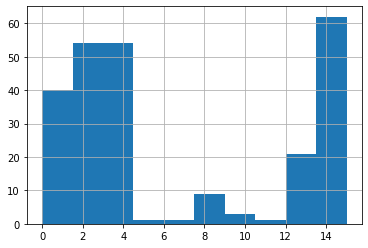

In [ ]:
clusters_fname = f"{dir_to_embed}_clusters.tsv"

# NOTE: when saving embeddings CSV, idx was a regular column (not a pandas 'index').
# When reloaded, 'idx' was made the index column. TODO: make original DF use 'idx' as index,
# so saving and reloading code is identical.
df.to_csv(clusters_fname, index=True, index_label="idx", sep="\t", header=True)

cdf = pd.read_csv(clusters_fname, delimiter="\t", index_col="idx")
cdf.knn_clusterid.hist()

In [ ]:
cdf.head()

,indiv_fname,orig_fname,label,emb_csv,knn_dist,knn_clusterid,knn_label
idx,,,,,,,
0,sb44p049.jpg,raster/epoch-20231214/01_FLAT/art/sb44p049.jpg,art,"1.1640998,0.22792715,-0.73929733,-0.6553513,0.9655936,-0.65341413,-0.40423846,0.39563477,-0.7537334,0.18012068,-0.5404834,-0.72562873,-0.662768,0.36820668,-0.607292,1.1540697,0.48222733,-0.6520286,-0.09952217,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,0.45420521,-0.6690378,-0.4518578,1.0451369,1.7706735,-0.45211998,-0.68509877,-0.67007643,1.2541986,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,1.7759606,0.49502707,-0.61049384,-0.58021957,0.9161315,-0.0101915,-0.75794554,-0.59257406,0.20002514,-0.6001429,-0.651804,0.026598394,0.21370798,-0.66552746,-0.6482407,-0.2381360...",141.85830,3,0_drawings
1,sb44p045.jpg,raster/epoch-20231214/01_FLAT/art/sb44p045.jpg,art,"1.953979,0.65047437,0.9241211,-0.0028326511,0.11344224,-0.65341413,0.8938088,1.3069756,-0.7537334,-0.42715576,0.032288134,-0.72562873,1.0637729,-0.6266761,0.26291752,2.0886006,-0.40865543,-0.5357227,-0.6898426,-0.6497359,0.22420949,-0.55193967,0.59766537,-0.6779002,0.66151613,-0.6690378,-0.4518578,-0.5982413,-0.73986673,-0.36358804,-0.68509877,-0.67007643,0.9263164,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,1.2313293,0.03624165,-0.61049384,0.16575068,2.1960793,-0.30818498,-0.75794554,-0.59257406,-0.6157326,-0.6001429,-0.651804,0.35413492,-0.10653335,-0.66552746,0.5276077,-0.47321...",199.47736,0,0_drawings
2,sb44p071.jpg,raster/epoch-20231214/01_FLAT/art/sb44p071.jpg,art,"2.1187599,0.6045204,-0.73929733,-0.6553513,-0.23066151,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,0.90604615,-0.72562873,-0.662768,-0.6266761,-0.45422596,1.4991544,-0.3564192,-0.5749769,-0.48463398,-0.6497359,-0.64108604,-0.55193967,-0.0065702796,-0.6779002,1.1430945,-0.6690378,-0.4518578,-0.13354072,0.723778,-0.45211998,-0.49096495,-0.07529694,0.8625003,-0.4592305,-0.600525,-0.49447894,0.31871945,-0.57338566,-0.2275807,1.9011816,-0.61049384,0.31181663,0.07525998,-0.6682474,-0.75794554,-0.59257406,-0.085001945,-0.09232569,-0.651804,-0.14051381,-0.4040383,-0.66552746,-0.307254...",126.89011,14,0_drawings
3,sb45p006.jpg,raster/epoch-20231214/01_FLAT/art/sb45p006.jpg,art,"2.2850146,0.9393651,-0.73929733,-0.19052204,0.18613452,-0.65341413,1.4616466,-0.4896673,-0.7537334,-0.4112748,2.129321,-0.72562873,-0.662768,0.4397242,0.031942844,1.9272195,-0.5467274,-0.6520286,0.56489015,-0.6497359,-0.022868693,-0.55193967,0.3385294,-0.6779002,0.80051666,-0.63204116,-0.4518578,-0.5982413,-0.73986673,-0.45211998,-0.68509877,-0.67007643,1.151843,-0.4592305,-0.600525,-0.077303946,-0.07233256,-0.57338566,1.6659857,1.128357,2.1367683,-0.42791077,-0.6189488,-0.6682474,-0.75794554,-0.59257406,0.4042446,-0.6001429,-0.651804,-0.14065802,1.0279104,-0.66552746,-0.6482407,0.00783798...",214.55875,2,0_drawings
4,sb44p117.jpg,raster/epoch-20231214/01_FLAT/art/sb44p117.jpg,art,"1.8807402,-0.08268669,-0.73929733,-0.048736393,0.27487272,-0.65341413,0.36167437,-0.19940448,-0.7537334,-0.42715576,1.1904901,-0.050569534,1.0996835,-0.27720487,0.1399191,-0.57515705,-0.5467274,-0.6520286,-0.6898426,-0.6497359,-0.16865411,-0.55193967,-0.5446661,-0.6779002,1.995444,-0.6690378,-0.4518578,0.10067254,-0.73986673,-0.45211998,-0.68509877,-0.39882153,0.36665255,-0.00076040626,-0.600525,-0.6186755,-0.73933,-0.57338566,0.72782135,0.41203368,-0.61049384,0.030192852,2.0226521,-0.6682474,-0.75794554,-0.5308377,-0.6157326,-0.6001429,-0.56889814,-0.5315948,1.3313551,-0.41978985,2.136505...",150.40149,0,0_drawings


<Axes: >

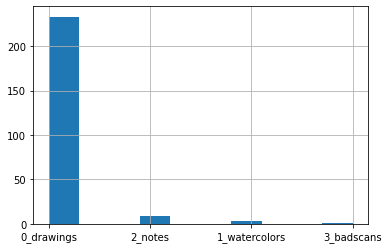

In [ ]:
cdf.knn_label.hist()

### visualize clusters

In [ ]:
# import matplotlib.pyplot as plt
# from mpl_toolkits.axes_grid1 import ImageGrid


# def show_cluster(clusters_df, clusters, idx):
#     imgs = [Image.open(clusters_df.iloc[i].abs_fname) for i in clusters[idx]]

#     fig = plt.figure(figsize=(16.0, 16.0))
#     grid = ImageGrid(
#         fig,
#         111,  # similar to subplot(111)
#         nrows_ncols=(4, 4),  # creates 2x2 grid of axes
#         axes_pad=0.1,  # pad between axes in inch.
#     )

#     for ax, im in zip(grid, imgs):
#         # Iterating over the grid returns the Axes.
#         ax.imshow(im)

#     plt.show()

In [ ]:
show_cluster(clusters_df=cdf, clusters=knn_clusterid, idx=0)

NameError: name 'show_cluster' is not defined

In [ ]:
# import matplotlib.pyplot as plt
# from mpl_toolkits.axes_grid1 import ImageGrid


# def show_all_clusters(clusters_df, clusters, cluster_idxs=None, title=None):
#     select_idxs = cluster_idxs if cluster_idxs else range(len(clusters))
#     num_clusters = len(select_idxs)
#     examples_per_cluster = 16
#     fig = plt.figure(figsize=(16.0, float(num_clusters)))
#     grid = ImageGrid(
#         fig,
#         111,  # similar to subplot(111)
#         nrows_ncols=(num_clusters, examples_per_cluster),
#         axes_pad=0.02,
#     )
#     for row, cluster_idx in enumerate(select_idxs):
#         imgs = [
#             Image.open(clusters_df.iloc[i].abs_fname) for i in clusters[cluster_idx]
#         ]

#         for col, im in enumerate(imgs):
#             total_idx = col + row * examples_per_cluster
#             ax = grid[total_idx]
#             ax.grid = False
#             ax.set_xticks([])
#             ax.set_yticks([])
#             if col == 0:
#                 ax.set_ylabel(f"{cluster_idx}  ", rotation=0)
#             ax.imshow(im)
#     if title:
#         fig.suptitle(
#             title
#             if cluster_idxs is None
#             else f"{title} (Cluster IDs: {','.join([str(i) for i in select_idxs])})"
#         )
#     plt.show()

In [ ]:
show_all_clusters(clusters_df=df, clusters=I)

In [ ]:
DRAWING_CLUSTERS = [0, 2, 3, 4, 8, 13, 14, 15]
WATERCOLOR_CLUSTERS = [5, 7, 11]
NOTES_CLUSTERS = [9, 12]
BAD_SCANS = [1, 6, 10]
COVERS = []

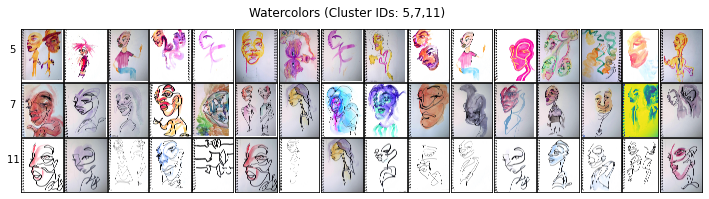

In [ ]:
show_all_clusters(
    clusters_df=df, clusters=I, cluster_idxs=WATERCOLOR_CLUSTERS, title="Watercolors"
)

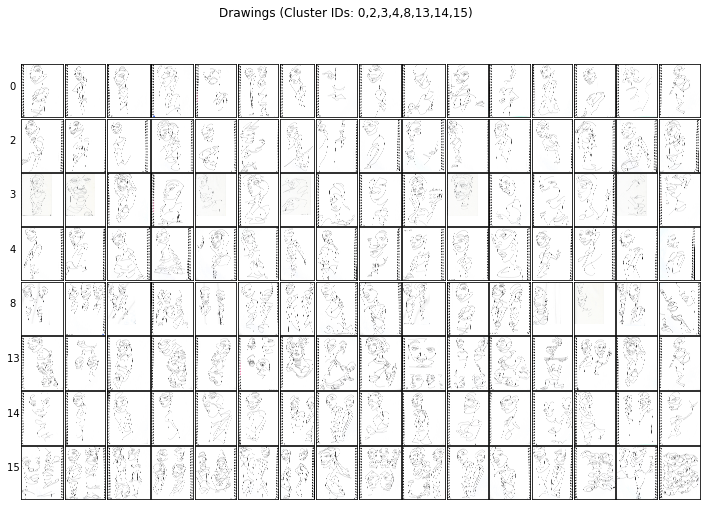

In [ ]:
show_all_clusters(
    clusters_df=df, clusters=I, cluster_idxs=DRAWING_CLUSTERS, title="Drawings"
)

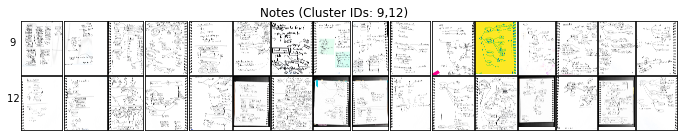

In [ ]:
show_all_clusters(
    clusters_df=df, clusters=I, cluster_idxs=NOTES_CLUSTERS, title="Notes"
)

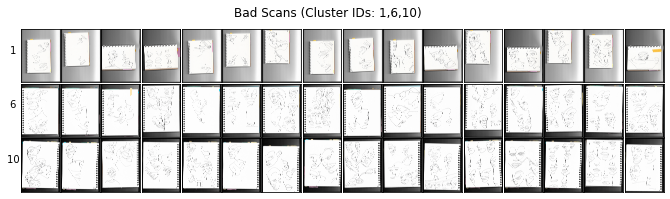

In [ ]:
show_all_clusters(clusters_df=df, clusters=I, cluster_idxs=BAD_SCANS, title="Bad Scans")

### T-SNE

In [ ]:
from sklearn.manifold import TSNE

y = list(df.label)
labels = list(set(y))
label_mapping = {label: i for i, label in enumerate(labels)}
y_idx = [label_mapping[label] for label in y]
print(labels, y_idx[:5])

X = embs
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X)

['art', 'cover', 'notes'] [0, 0, 2, 0, 0]


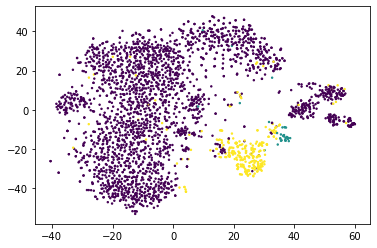

In [ ]:
fig = plt.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], c=y_idx, s=2)

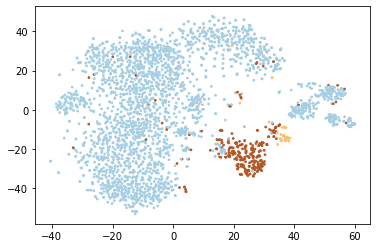

In [ ]:
fig = plt.scatter(
    x=X_tsne[:, 0], y=X_tsne[:, 1], c=y_idx, s=3.0, cmap=plt.get_cmap("Paired")
)

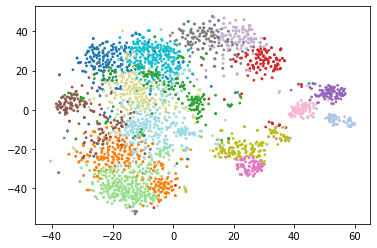

In [ ]:
fig = plt.scatter(
    x=X_tsne[:, 0], y=X_tsne[:, 1], c=df.cluster, s=3.0, cmap=plt.get_cmap("tab20")
)

In [ ]:
def metacluster(x):
    if x in DRAWING_CLUSTERS:
        return 0
    if x in WATERCOLOR_CLUSTERS:
        return 1
    if x in NOTES_CLUSTERS:
        return 2
    if x in BAD_SCANS:
        return 3
    if x in COVERS:
        return 4
    else:
        raise Exception(f"invalid cluster: {x}")


metacluster_id_to_name = {
    0: "0_drawings",
    1: "1_watercolors",
    2: "2_notes",
    3: "3_badscans",
    4: "4_covers",
}

metacluster_name_to_id = {v: k for k, v in metacluster_id_to_name.items()}
metacluster_name_to_id

{'0_drawings': 0,
 '1_watercolors': 1,
 '2_notes': 2,
 '3_badscans': 3,
 '4_covers': 4}

In [ ]:
df["metacluster"] = [metacluster(x) for x in list(df.cluster)]
df["metacluster_name"] = [metacluster_id_to_name(i) for i in list(df.metacluster)]

df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,metacluster_name
idx,,,,,,,,,,,
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,1_watercolors
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,0_drawings
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/notes/sb06p023.jpg,notes/sb06p023.jpg,notes,xtra,4,"0.171455,0.008462,0.007966,0.016696,0.795421","2.071539,1.9655468,-0.73929733,0.5748948,3.170734,-0.65341413,0.63399774,1.729534,-0.7537334,0.84828806,-0.62038505,-0.72562873,-0.662768,-0.6266761,-0.68991846,2.328189,0.38060355,1.1197739,0.73272705,-0.6497359,-0.64108604,1.9738588,0.9751267,-0.6779002,0.62476915,-0.6690378,-0.4518578,1.4331162,-0.73986673,0.5611434,-0.68509877,0.6532827,2.040183,0.9425397,0.18940705,-0.27290884,0.1475305,-0.57338566,1.9694935,1.2107165,-0.61049384,1.9219763,-0.047254384,-0.6682474,-0.75794554,-0.59257406,-0.6157326,-0.17440769,-0.18534619,1.6759431,-0.59497476,-0.66552746,0.67768025,2.0296078,-0.731109...",6,223.15668,3,3_badscans
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3776337,-0.5714155,-0.2587232,-0.6553513,1.3532461,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.25077122,0.050992966,-0.72562873,0.1406585,-0.6266761,1.0653365,0.96198404,-0.5467274,0.30261123,0.6327609,-0.6497359,-0.64108604,-0.28434965,-0.35651857,-0.6779002,-0.28245115,-0.6690378,-0.4518578,0.030088186,-0.73986673,-0.18931103,-0.041653574,-0.67007643,-0.52171326,-0.29881266,-0.600525,-0.23231092,-0.73933,-0.57338566,-0.65925777,1.8833572,-0.61049384,0.44560486,0.14075392,-0.6682474,-0.75794554,-0.59257406,-0.07511848,-0.6001429,-0.651804,-0.5315948,0.023931146,0.723624,-0.6482407,-...",8,188.58075,0,0_drawings
4,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb07p104.jpg,art/sb07p104.jpg,art,xtra,4,"0.177406,0.008799,0.008245,0.017177,0.788373","-0.39105213,0.96309596,-0.73929733,0.4489988,0.8297614,-0.3937308,-0.7267234,-0.32461396,-0.7537334,-0.42715576,-0.62038505,-0.72562873,0.3037846,-0.6266761,-0.5213815,-0.31669965,-0.5467274,-0.6520286,-0.22544897,-0.6497359,-0.64108604,0.6374447,-0.5446661,-0.6779002,-0.14143991,-0.6690378,-0.44753593,0.66945183,-0.73986673,-0.45211998,-0.05996394,-0.21525535,0.82928157,-0.04412651,-0.600525,-0.04148197,-0.73825717,-0.57338566,-0.25227422,2.3566113,-0.61049384,1.0027854,-0.40134108,1.3733256,-0.75794554,-0.59257406,-0.4395525,-0.6001429,1.0358506,1

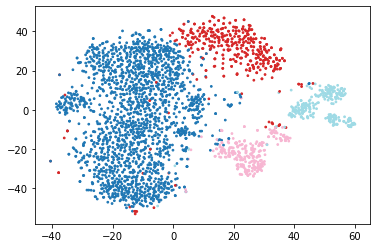

In [ ]:
fig = plt.scatter(
    x=X_tsne[:, 0], y=X_tsne[:, 1], c=df.metacluster, s=3.0, cmap=plt.get_cmap("tab20")
)

### categorizing clusters, bucketing images into new dir

Thinking out loud:
- how to make these scripts idempotent?
- ideally, when I get these images bucketed by directory, I can manually "re-label" any incorrect ones by moving them to a new dir.

when I add more files at the input stage, it'd be nice if I could re-run the scripts:
- flatten should copy over the new files (maybe it doesn't need to replace - that'd be faster)
- vis-cluster not recategorizing the ones I've already labeled would be helpful.
    - do I need to save `kmeans.faiss` and/or `index.faiss` for this to work?

In [ ]:
categorized_dir = EPOCH.dir_02_CATEGORIZED()

df["categorized_path"] = df.apply(
    lambda row: os.path.join(row["knn_label"], row["indiv_fname"]), axis=1
)
# # dir_to_embed = singleline_data_home() / "raster/epoch-20231214/01_FLAT"
# dest_dir = (
#     singleline_data_home() / "raster/epoch-20231214/02_VISUAL_CATEGORIES"
# )

# add useful metadata about where we're going to move the files to

# df["indiv_fname"] = df.rel_fname.map(lambda f: os.path.basename(f))
# df["visual_abs_path"] = df.visual_rel_path.map(lambda f: os.path.join(dest_dir, f))

# print(df["indiv_fname"][0:3])
# print(df["visual_rel_path"][0:3])
# print(df["visual_abs_path"][0:3])

In [ ]:
metaclusters_fname = f"{dir_to_embed}/metaclusters.tsv"
df.to_csv(metaclusters_fname, index=True, index_label="idx", sep="\t", header=True)

metaclusters_df = pd.read_csv(metaclusters_fname, delimiter="\t", index_col="idx")
metaclusters_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,metacluster_name,indiv_fname,visual_rel_path,visual_abs_path
idx,,,,,,,,,,,,,,
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,1_watercolors,sb77p043.jpg,1_watercolors/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb77p043.jpg
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,0_drawings,sb67p021.jpg,0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb67p021.jpg
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/notes/sb06p023.jpg,notes/sb06p023.jpg,notes,xtra,4,"0.171455,0.008462,0.007966,0.016696,0.795421","2.071539,1.9655468,-0.73929733,0.5748948,3.170734,-0.65341413,0.63399774,1.729534,-0.7537334,0.84828806,-0.62038505,-0.72562873,-0.662768,-0.6266761,-0.68991846,2.328189,0.38060355,1.1197739,0.73272705,-0.6497359,-0.64108604,1.9738588,0.9751267,-0.6779002,0.62476915,-0.6690378,-0.4518578,1.4331162,-0.73986673,0.5611434,-0.68509877,0.6532827,2.040183,0.9425397,0.18940705,-0.27290884,0.1475305,-0.57338566,1.9694935,1.2107165,-0.61049384,1.9219763,-0.047254384,-0.6682474,-0.75794554,-0.59257406,-0.6157326,-0.17440769,-0.18534619,1.6759431,-0.59497476,-0.66552746,0.67768025,2.0296078,-0.731109...",6,223.15668,3,3_badscans,sb06p023.jpg,3_badscans/sb06p023.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/3_badscans/sb06p023.jpg
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3776337,-0.5714155,-0.2587232,-0.6553513,1.3532461,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.25077122,0.050992966,-0.72562873,0.1406585,-0.6266761,1.0653365,0.96198404,-0.5467274,0.30261123,0.6327609,-0.6497359,-0.64108604,-0.28434965,-0.35651857,-0.6779002,-0.28245115,-0.6690378,-0.4518578,0.030088186,-0.73986673,-0.18931103,-0.041653574,-0.67007643,-0.52171326,-0.29881266,-0.600525,-0.23231092,-0.73933,-0.57338566,-0.65925777,1.8833572,-0.61049384,0.44560486,0.14075392,-0.6682474,-0.75794554,-0.59257406,-0.07511848,-0.6001429,-0.651804,-0.5315948,0.023931146,0.723624,-0.6482407,-...",8,188.58075,0,0_drawings,sb25p227.jpg,0_drawings/sb25p227.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb25p227.jpg
4,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb07p104.jpg,art/sb07p104.jpg,art,x

### moving files

(#2922) [Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb35p001.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb38p036.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb72p077.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb44p049.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb38p022.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p001.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb72p063.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb72p004--coffee.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb35p015.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb28p036.jpg')...]

In [ ]:
test_files = get_image_files(dir_to_embed)
print(test_files)
L(os.path.basename(f) for f in test_files)

(#2922) ['sb35p001.jpg','sb38p036.jpg','sb72p077.jpg','sb44p049.jpg','sb38p022.jpg','sb25p001.jpg','sb72p063.jpg','sb72p004--coffee.jpg','sb35p015.jpg','sb28p036.jpg'...]

In [ ]:
"NON_EXISTENT" in L(os.path.basename(f) for f in test_files), "sb38p036.jpg" in L(
    os.path.basename(f) for f in test_files
)

(False, True)

In [ ]:
existing_files = get_image_files(dest_dir)

In [ ]:
existing_files

(#0) []

In [ ]:
import math
import os
import shutil

from PIL import Image

"""
inputs:
- dest_dir
- metaclusters_df
"""


existing_files = L(os.path.basename(f) for f in get_image_files(dest_dir))

for idx in range(len(metaclusters_df)):
    row = metaclusters_df.iloc[idx]

    indiv_fname = row.indiv_fname
    if indiv_fname in existing_files:
        print(f"skipping {indiv_fname}")
        continue

    orig_abs_path = row.abs_fname
    visual_abs_path = row.visual_abs_path

    visual_dir = os.path.dirname(visual_abs_path)
    if not os.path.isdir(visual_dir):
        os.makedirs(visual_dir)

    print(f"writing to {visual_abs_path}")
    shutil.copy(orig_abs_path, visual_abs_path)
    # try:
    #     img = Image.open(f"/Users/al/Dropbox/2-Areas/2-Sketchbooks/{row.fname}")
    #     crop_amt = math.floor(img.size[0] * 20 / 224)
    #     cropped_img = img.crop((crop_amt, 0, img.size[0] - crop_amt, img.size[1]))
    #     # cropped_img
    #     cropped_img.save(out_path)
    # except Exception as e:
    #     print(e)

skipping sb77p043.jpg
skipping sb67p021.jpg
skipping sb06p023.jpg
skipping sb25p227.jpg
skipping sb07p104.jpg
skipping sb31p017.jpg
writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb48p057.jpg
writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/3_badscans/sb01p007.jpg
writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb77p044.jpg
writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/2_notes/sb06p076.jpg
writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb11p024.jpg
writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb67p006--kitchen-nap.jpg
writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb68p093.jpg
writing to /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2

## hand-labeling (+ braindump)

Since the clusters weren't 100% accurate, I hand-edited the clusters (by going through each folder, tagging anything that belonged in a different folder, then grouping the folder by tags and moving out any tagged files).

First I copied this directory:
```
full-v2/02_VISUAL_CATEGORIES
```

to
```
full-v2/03_VISUAL_HAND_LABELED
```

So, I should probably
- [ ] iterate through the files in `metaclusters_df` and mark what their updated relpaths are
- [ ] save the result to a TSV file (in `03_VISUAL_HAND_LABELED`?)
- [ ] update my cropping code below to use the more accurately selected files when populating `10_SIMPLE_CROP`
- [ ] (maybe) also save the filepath of the cropped files?

Then, if I want, I could 
- re-cluster within the watercolors and within the drawings. Perhaps cluster on the cropped versions? That might give me a starting point for filtering down to a more similar set of drawings.
- Alternatively, I might get more bang for my buck by going into vector land and splitting the non-overlapping strokes into separate drawings
- Also: can i find and filter out all diagchains / tower drawings? those might clarify the signal a bit

And it'd be really fun (!) to...
- [Visualizing Data using the Embedding Projector in TensorBoard  |  TensorFlow](https://www.tensorflow.org/tensorboard/tensorboard_projector_plugin)
- [Taking the TensorBoard Embedding Projector to the Next Level](https://towardsdatascience.com/taking-the-tensorboard-embedding-projector-to-the-next-level-bde53deb6bb7)
- though I'll want clear PNG's for the sprites. perhaps this is easier to do after I've vectorized and re-saved to SVG.

I'm also curious whether there's anything automated I can do to:
- do "face detection", so I'm only working with actual drawings of faces?
- full-train on quickdraw faces dataset, then fine-tune on my face drawings?
- detect bounding boxes for handwriting on the page (potentially crop it out at vectorization time?)
- detect edge of sketchbook pages?
- detect poorly scanned / crop to just the page?

Side note re: the handlabeling process:
- why didn't "covers" get their own cluster?
- where did all the "xtra" ones go? were they in 'badcovers' (which I didn't manually sort through yet)

### first, get a mapping of `indiv_fname` to the relative path within `03_VISUAL_HAND_LABELED`

In [ ]:
handlabeled_dir = (
    singleline_data_home() / "raster/epoch-20231214/03_VISUAL_HAND_LABELED"
)

handlabeled_files = get_image_files(handlabeled_dir)
handlabeled_files

(#2922) [Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/3_badscans/sb07p023.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/3_badscans/sb07p037.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/3_badscans/sb32p121.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/3_badscans/sb06p032.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/3_badscans/sb06p026.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/3_badscans/sb01p119-horiz.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/3_badscans/sb06p027.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/3_badscans/sb06p033.jpg'),Path('/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/3_b

In [ ]:
def basename_and_parent(f):
    base = os.path.basename(f)
    parent_abs = os.path.dirname(f)
    parent_base = os.path.basename(parent_abs)
    handlabeled_relpath = os.path.join(parent_base, base)
    return base, handlabeled_relpath


label_mapping = {
    base: parent for base, parent in [basename_and_parent(f) for f in handlabeled_files]
}

### infer hand-chosen label

In [ ]:
metaclusters_df.head()

In [ ]:
metaclusters_df["handlabeled_rel_path"] = metaclusters_df.indiv_fname.map(
    lambda f: label_mapping[f]
)
print(metaclusters_df.handlabeled_rel_path[:5])

metaclusters_df["handlabeled_abs_path"] = metaclusters_df.handlabeled_rel_path.map(
    lambda p: os.path.join(handlabeled_dir, p)
)
print(metaclusters_df.handlabeled_abs_path[:5])

metaclusters_df[
    "handlabeled_metacluster_name"
] = metaclusters_df.handlabeled_rel_path.map(lambda p: os.path.dirname(p))
print(metaclusters_df.handlabeled_metacluster_name[:5])

metaclusters_df[
    "handlabeled_metacluster_id"
] = metaclusters_df.handlabeled_metacluster_name.map(
    lambda n: metacluster_name_to_id[n]
)

idx
0       0_drawings/sb77p043.jpg
1       0_drawings/sb67p021.jpg
2       3_badscans/sb06p023.jpg
3       0_drawings/sb25p227.jpg
4    1_watercolors/sb07p104.jpg
Name: handlabeled_rel_path, dtype: object
idx
0       /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb77p043.jpg
1       /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb67p021.jpg
2       /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/3_badscans/sb06p023.jpg
3       /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb25p227.jpg
4    /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/1_watercolors/sb07p104.jpg
Name: handlabeled_abs_path, dtype: object
idx
0       0_drawings
1       0_drawings
2       3_badscans
3       0_drawings
4    1_watercolors
Name: handlabeled_metacluster_name, dtype: object


In [ ]:
# note to self: give this a better name
# - not calling it "metacluster", instead -> "visual category"? "category"?
# - "metacluster_id"

# comparing the id's
metaclusters_df[["handlabeled_metacluster_id", "metacluster"]][:5]

,handlabeled_metacluster_id,metacluster
idx,,
0,0,1
1,0,0
2,3,3
3,0,0
4,1,1


In [ ]:
# did the label change when I had to hand-label?
metaclusters_df["handlabeled_metacluster_was_correct"] = metaclusters_df.apply(
    lambda row: row.metacluster == row.handlabeled_metacluster_id, axis=1
)[:20]
print(metaclusters_df.handlabeled_metacluster_was_correct[:10])

idx
0    False
1     True
2     True
3     True
4     True
5     True
6     True
7     True
8     True
9     True
dtype: bool


### precompute path to which the image is going to get preprocessed/cropped, save DF as `handlabeled.tsv`

In [ ]:
preprocessing_dir = (
    singleline_data_home() / "raster/epoch-20231214/10_SIMPLE_CROP"
)

metaclusters_df["preprocessed_abs_path"] = metaclusters_df.handlabeled_rel_path.map(
    lambda p: os.path.join(preprocessing_dir, p)
)
metaclusters_df.preprocessed_abs_path[:5]

idx
0       /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg
1       /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg
2       /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/3_badscans/sb06p023.jpg
3       /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb25p227.jpg
4    /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/1_watercolors/sb07p104.jpg
Name: preprocessed_abs_path, dtype: object

In [ ]:
metaclusters_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,metacluster_name,indiv_fname,visual_rel_path,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path
idx,,,,,,,,,,,,,,,,,,,,
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,1_watercolors,sb77p043.jpg,1_watercolors/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb77p043.jpg,0_drawings/sb77p043.jpg,0_drawings,0,False,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb77p043.jpg
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,0_drawings,sb67p021.jpg,0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb67p021.jpg,0_drawings/sb67p021.jpg,0_drawings,0,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb67p021.jpg
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/notes/sb06p023.jpg,notes/sb06p023.jpg,notes,xtra,4,"0.171455,0.008462,0.007966,0.016696,0.795421","2.071539,1.9655468,-0.73929733,0.5748948,3.170734,-0.65341413,0.63399774,1.729534,-0.7537334,0.84828806,-0.62038505,-0.72562873,-0.662768,-0.6266761,-0.68991846,2.328189,0.38060355,1.1197739,0.73272705,-0.6497359,-0.64108604,1.9738588,0.9751267,-0.6779002,0.62476915,-0.6690378,-0.4518578,1.4331162,-0.73986673,0.5611434,-0.68509877,0.6532827,2.040183,0.9425397,0.18940705,-0.27290884,0.1475305,-0.57338566,1.9694935,1.2107165,-0.61049384,1.9219763,-0.047254384,-0.6682474,-0.75794554,-0.59257406,-0.6157326,-0.17440769,-0.18534619,1.6759431,-0.59497476,-0.66552746,0.67768025,2.0296078,-0.731109...",6,223.15668,3,3_badscans,sb06p023.jpg,3_badscans/sb06p023.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/3_badscans/sb06p023.jpg,3_badscans/sb06p023.jpg,3_badscans,3,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/3_badscans/sb06p023.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/3_badscans/sb06p023.jpg
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.

In [ ]:
handlabeled_tsv_fname = f"{handlabeled_dir}/handlabeled.tsv"

metaclusters_df.to_csv(
    handlabeled_tsv_fname, index=True, index_label="idx", sep="\t", header=True
)

handlabeled_df = pd.read_csv(handlabeled_tsv_fname, delimiter="\t", index_col="idx")

hdf = handlabeled_df
hdf.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,metacluster_name,indiv_fname,visual_rel_path,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path
idx,,,,,,,,,,,,,,,,,,,,
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,1_watercolors,sb77p043.jpg,1_watercolors/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb77p043.jpg,0_drawings/sb77p043.jpg,0_drawings,0,False,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb77p043.jpg
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,0_drawings,sb67p021.jpg,0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb67p021.jpg,0_drawings/sb67p021.jpg,0_drawings,0,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb67p021.jpg
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/notes/sb06p023.jpg,notes/sb06p023.jpg,notes,xtra,4,"0.171455,0.008462,0.007966,0.016696,0.795421","2.071539,1.9655468,-0.73929733,0.5748948,3.170734,-0.65341413,0.63399774,1.729534,-0.7537334,0.84828806,-0.62038505,-0.72562873,-0.662768,-0.6266761,-0.68991846,2.328189,0.38060355,1.1197739,0.73272705,-0.6497359,-0.64108604,1.9738588,0.9751267,-0.6779002,0.62476915,-0.6690378,-0.4518578,1.4331162,-0.73986673,0.5611434,-0.68509877,0.6532827,2.040183,0.9425397,0.18940705,-0.27290884,0.1475305,-0.57338566,1.9694935,1.2107165,-0.61049384,1.9219763,-0.047254384,-0.6682474,-0.75794554,-0.59257406,-0.6157326,-0.17440769,-0.18534619,1.6759431,-0.59497476,-0.66552746,0.67768025,2.0296078,-0.731109...",6,223.15668,3,3_badscans,sb06p023.jpg,3_badscans/sb06p023.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/3_badscans/sb06p023.jpg,3_badscans/sb06p023.jpg,3_badscans,3,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/3_badscans/sb06p023.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/3_badscans/sb06p023.jpg
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.

### side quest: how accurate was clustering for separating the categories I care about?

Time to make a classification report!

- [sklearn.metrics.classification\_report — scikit-learn 1.3.2 documentation](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html)
- [sklearn.metrics.confusion\_matrix — scikit-learn 1.3.2 documentation](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html#sklearn.metrics.confusion_matrix)
- https://scikit-learn.org/stable/modules/model_evaluation.html#confusion-matrix
- [sklearn.metrics.ConfusionMatrixDisplay — scikit-learn 1.3.2 documentation](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html#sklearn.metrics.ConfusionMatrixDisplay)

In [ ]:
from sklearn.metrics import classification_report

target_names = list(metacluster_id_to_name.values())

y_true = metaclusters_df.handlabeled_metacluster_id
y_pred = metaclusters_df.metacluster

print(classification_report(y_true, y_pred, target_names=target_names))

               precision    recall  f1-score   support

   0_drawings       0.95      0.96      0.96      1923
1_watercolors       0.83      0.93      0.88       404
      2_notes       0.86      0.79      0.82       287
   3_badscans       1.00      0.99      0.99       269
     4_covers       0.00      0.00      0.00        39

     accuracy                           0.93      2922
    macro avg       0.73      0.73      0.73      2922
 weighted avg       0.92      0.93      0.92      2922



/Users/al/miniconda3_m1/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/al/miniconda3_m1/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/al/miniconda3_m1/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<sklearn.metrics._plot.confusion_matrix.ConfusionMatrixDisplay>

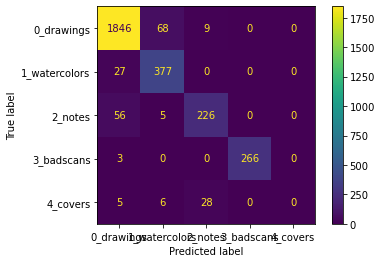

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_names)
disp.plot()
# plt.show()

In [ ]:
# for idx in range(len(metaclusters_df)):

#     if idx > 10:
#         break

#     row = metaclusters_df.iloc[idx]

#     indiv_fname = row.indiv_fname

#     handlabeled_rel_path = label_mapping[indiv_fname]
#     handlabeled_metacluster_name = os.path.dirname(handlabeled_rel_path)
#     print(handlabeled_rel_path, handlabeled_metacluster_name, row.metacluster_name)

## processing

### v0: dummy crop (both sides, by a fixed percentage)

In [ ]:
# preprocessing_dir = (
#     singleline_data_home() / "raster/epoch-20231214/10_SIMPLE_CROP"
# )  # <-- this was defined earlier.
existing_files = L(os.path.basename(f) for f in get_image_files(preprocessing_dir))

crop_frac = 20.0 / 224
print(f"using crop_frac={crop_frac}")

for idx in range(len(metaclusters_df)):

    # if idx > 10:
    #     break

    row = metaclusters_df.iloc[idx]
    # if row.metacluster_name != "0_drawings":
    #     # print(f"ignore {row.metacluster_name}")
    #     continue

    indiv_fname = row.indiv_fname
    if indiv_fname in existing_files:
        print(f"skipping {indiv_fname}")
        continue

    # handlabeled_rel_path = row.handlabeled_rel_path
    # preproc_abs_path = os.path.join(preprocessing_dir, handlabeled_rel_path)
    preproc_abs_path = row.preprocessed_abs_path
    # print(preproc_abs_path)

    preproc_dir = os.path.dirname(preproc_abs_path)
    if not os.path.isdir(preproc_dir):
        os.makedirs(preproc_dir)

    handlabeled_abs_path = row.handlabeled_abs_path
    print(f"writing from {handlabeled_abs_path} to {preproc_abs_path}")

    try:
        img = Image.open(handlabeled_abs_path)
        print(img.size)
        crop_amt = math.floor(
            img.size[0] * crop_frac
        )  # compute number of pixels to crop (roughly 8% of page size)
        cropped_img = img.crop((crop_amt, 0, img.size[0] - crop_amt, img.size[1]))
        # cropped_img
        cropped_img.save(preproc_abs_path)
    except Exception as e:
        print(e)

using crop_frac=0.08928571428571429
writing from /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb77p043.jpg to /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg
(1920, 2461)
writing from /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb67p021.jpg to /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg
(2006, 2597)
writing from /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/3_badscans/sb06p023.jpg to /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/3_badscans/sb06p023.jpg
(1700, 2338)
writing from /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb25p227.jpg to /Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb25p227.jpg
(1364, 2024)
writing from /Users/al/Dropbox/2-Areas/2-Sketchb

### get embeddings for the cropped images

In [ ]:
cropped_emb_rows = []
for x in embed_dir(
    preprocessing_dir, learn
):  # important: use "preprocessing_dir" so we get embeds of the cropped imgs
    cropped_emb_rows.append(x)
cropped_embd_df = pd.DataFrame(cropped_emb_rows)
print(f"num rows: {len(cropped_embd_df)}")
cropped_embd_df.head()

total items: 2922, num batches: 46


num rows: 2922


,idx,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv
0,0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb25p199.jpg,0_drawings/sb25p199.jpg,0_drawings,xtra,4,"0.163658,0.008260,0.008051,0.016511,0.803520","-0.5330713,-0.5714155,0.73641866,-0.6553513,-0.6254566,-0.65341413,0.13287973,-0.4896673,-0.7537334,0.25619665,-0.18803719,-0.72562873,-0.662768,-0.6266761,0.64458674,-0.57515705,-0.5467274,-0.071858704,1.1719493,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.46651447,0.3104514,0.90333235,-0.44427776,-0.46260503,1.2030442,-0.45211998,-0.2965303,-0.67007643,0.9364619,-0.4592305,-0.600525,-0.49382913,-0.73933,-0.57338566,-0.5953745,0.43034816,-0.61049384,0.8340209,-0.6189488,-0.1796374,-0.30213186,-0.59257406,0.2503296,-0.6001429,-0.4512694,-0.5315948,-0.59497476,-0.66552746,0.7661344,-0.1..."
1,1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb25p043.jpg,0_drawings/sb25p043.jpg,0_drawings,xtra,4,"0.153572,0.008271,0.007657,0.016232,0.814268","-0.6198182,-0.5714155,-0.73929733,-0.6553513,-0.6254566,-0.65341413,-0.3503988,-0.4896673,-0.7537334,0.6263685,0.6809032,-0.72562873,0.24799824,-0.6266761,0.94325465,0.30273575,-0.5467274,0.12154883,0.7854639,-0.6497359,-0.510615,-0.55193967,-0.5446661,-0.6779002,-0.57759243,0.5402647,-0.4518578,-0.5982413,-0.35663128,-0.45211998,-0.68509877,-0.67007643,0.21951097,-0.4592305,-0.14663172,-0.6186755,0.7839405,-0.57338566,0.08800787,1.0596322,-0.61049384,0.058719218,-0.0042130947,-0.6682474,0.108083844,-0.59257406,0.63600713,-0.6001429,-0.651804,-0.5315948,-0.5008225,0.18616694,-0.4135767,-0...."
2,2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/1_watercolors/sb26p011.jpg,1_watercolors/sb26p011.jpg,1_watercolors,xtra,4,"0.168120,0.008694,0.008156,0.016850,0.798180","1.3847659,-0.5714155,-0.73929733,1.9980699,-0.38369656,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.09318411,-0.5577197,-0.72562873,-0.662768,1.3684493,-0.6397908,-0.57515705,-0.5467274,-0.6520286,1.2087092,-0.6497359,-0.64108604,-0.55193967,1.1091483,1.2902013,0.6211384,-0.2669702,-0.4518578,0.72892654,1.2568704,0.11155799,0.59543765,-0.67007643,0.14250022,-0.4006025,-0.600525,1.2841779,-0.73933,0.03668952,-0.65925777,1.0671545,-0.61049384,-0.58021957,0.48637342,0.40816802,1.7963738,-0.51651776,0.10670686,-0.6001429,-0.651804,-0.5315948,0.9057182,1.036983,0.6402601,-0.39563733,-0.43874..."
3,3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/2_notes/sb46p090-fundraising-deck-illustrations.jpg,2_notes/sb46p090-fundraising-deck-illustrations.jpg,2_notes,xtra,4,"0.171107,0.008683,0.008175,0.016800,0.795234","-0.52853656,2.5605347,-0.73929733,-0.6553513,2.4787,-0.65341413,-0.7267234,1.532997,-0.7537334,2.886949,2.3408055,-0.72562873,-0.29813898,-0.6266761,-0.68991846,0.0828715,2.9314456,-0.6520286,3.5069184,-0.6497359,-0.64108604,0.39781398,-0.5446661,-0.6779002,-0.57759243,-0.6690378,0.77024436,-0.36507833,3.7055478,2.4240553,-0.68509877,-0.67007643,2.9676533,1.0786949,0.7419685,-0.6186755,1.2447245,1.4471076,0.9406444,-0.6179389,-0.61049384,2.6705651,-0.30582196,-0.6682474,-0.75794554,-0.4556011,2.5623467,-0.6001429,-0.651804,2.429375,-0.59497476,-0.66552746,-0.6482407,4.322685,-0.37778312,2...."
4,4,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb38p002.jpg,0_drawings/sb38p002.jpg,0_drawings,xtra,4,"0.159390,0.008279,0.008010,0.016125,0.808195","2.1299553,0.7444822,-0.73929733,-0.6553513,0.15277767,-0.04387927,-0.49867624,-0.4896673,-0.7537334,0.088731796,1.2834122,-0.72562873,1.3512818,-0.6266761,0.7380045,0.66530037,-0.5467274,-0.6520286,0.6048254,-0.6497359,-0.64108604,-0.55193967,-0.5409544,-0.6779002,1.4321909,-0.6551965,-0.4518578,-0.5982413,0.24350339,-0.45211998,-0.34182537,-0.67007643,0.96453965,-0.2583686,-0.600525,-0.6186755,-0.327084,-0.34915227,1.854417,1.7647287,-0.61049384,0.027278483,1.9321591,-0.6682474,-0.75794554,-0.59257406,-0.510

join the dataframes.

from [pandas.DataFrame.join — pandas 2.1.4 documentation](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.join.html):

> Another option to join using the key columns is to use the on parameter. DataFrame.join always uses other’s index but we can use any column in df. This method preserves the original DataFrame’s index in the result.
> Note: default is a "left" join, preserving the left's index space.

`rsuffix` to add `_cropped` to any overlapping column names.

Here are the expected columns:
```
idx        # totally different from index scheme already being used - kill it
abs_fname  # should be same as preprocessed_abs_path
rel_fname  # same as humanlabeled_rel_path (JOIN KEY)
label      # same as humanlabeled_metacluster_name
pred_label # DROP
pred_idx   # DROP
pred_probs # DROP
emb_csv    # keep this!
```


In [ ]:
del cropped_embd_df["idx"]
del cropped_embd_df["pred_label"]
del cropped_embd_df["pred_probs"]
del cropped_embd_df["pred_idx"]
cropped_embd_df.head()

,abs_fname,rel_fname,label,emb_csv
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb25p199.jpg,0_drawings/sb25p199.jpg,0_drawings,"-0.5330713,-0.5714155,0.73641866,-0.6553513,-0.6254566,-0.65341413,0.13287973,-0.4896673,-0.7537334,0.25619665,-0.18803719,-0.72562873,-0.662768,-0.6266761,0.64458674,-0.57515705,-0.5467274,-0.071858704,1.1719493,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.46651447,0.3104514,0.90333235,-0.44427776,-0.46260503,1.2030442,-0.45211998,-0.2965303,-0.67007643,0.9364619,-0.4592305,-0.600525,-0.49382913,-0.73933,-0.57338566,-0.5953745,0.43034816,-0.61049384,0.8340209,-0.6189488,-0.1796374,-0.30213186,-0.59257406,0.2503296,-0.6001429,-0.4512694,-0.5315948,-0.59497476,-0.66552746,0.7661344,-0.1..."
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb25p043.jpg,0_drawings/sb25p043.jpg,0_drawings,"-0.6198182,-0.5714155,-0.73929733,-0.6553513,-0.6254566,-0.65341413,-0.3503988,-0.4896673,-0.7537334,0.6263685,0.6809032,-0.72562873,0.24799824,-0.6266761,0.94325465,0.30273575,-0.5467274,0.12154883,0.7854639,-0.6497359,-0.510615,-0.55193967,-0.5446661,-0.6779002,-0.57759243,0.5402647,-0.4518578,-0.5982413,-0.35663128,-0.45211998,-0.68509877,-0.67007643,0.21951097,-0.4592305,-0.14663172,-0.6186755,0.7839405,-0.57338566,0.08800787,1.0596322,-0.61049384,0.058719218,-0.0042130947,-0.6682474,0.108083844,-0.59257406,0.63600713,-0.6001429,-0.651804,-0.5315948,-0.5008225,0.18616694,-0.4135767,-0...."
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/1_watercolors/sb26p011.jpg,1_watercolors/sb26p011.jpg,1_watercolors,"1.3847659,-0.5714155,-0.73929733,1.9980699,-0.38369656,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.09318411,-0.5577197,-0.72562873,-0.662768,1.3684493,-0.6397908,-0.57515705,-0.5467274,-0.6520286,1.2087092,-0.6497359,-0.64108604,-0.55193967,1.1091483,1.2902013,0.6211384,-0.2669702,-0.4518578,0.72892654,1.2568704,0.11155799,0.59543765,-0.67007643,0.14250022,-0.4006025,-0.600525,1.2841779,-0.73933,0.03668952,-0.65925777,1.0671545,-0.61049384,-0.58021957,0.48637342,0.40816802,1.7963738,-0.51651776,0.10670686,-0.6001429,-0.651804,-0.5315948,0.9057182,1.036983,0.6402601,-0.39563733,-0.43874..."
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/2_notes/sb46p090-fundraising-deck-illustrations.jpg,2_notes/sb46p090-fundraising-deck-illustrations.jpg,2_notes,"-0.52853656,2.5605347,-0.73929733,-0.6553513,2.4787,-0.65341413,-0.7267234,1.532997,-0.7537334,2.886949,2.3408055,-0.72562873,-0.29813898,-0.6266761,-0.68991846,0.0828715,2.9314456,-0.6520286,3.5069184,-0.6497359,-0.64108604,0.39781398,-0.5446661,-0.6779002,-0.57759243,-0.6690378,0.77024436,-0.36507833,3.7055478,2.4240553,-0.68509877,-0.67007643,2.9676533,1.0786949,0.7419685,-0.6186755,1.2447245,1.4471076,0.9406444,-0.6179389,-0.61049384,2.6705651,-0.30582196,-0.6682474,-0.75794554,-0.4556011,2.5623467,-0.6001429,-0.651804,2.429375,-0.59497476,-0.66552746,-0.6482407,4.322685,-0.37778312,2...."
4,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb38p002.jpg,0_drawings/sb38p002.jpg,0_drawings,"2.1299553,0.7444822,-0.73929733,-0.6553513,0.15277767,-0.04387927,-0.49867624,-0.4896673,-0.7537334,0.088731796,1.2834122,-0.72562873,1.3512818,-0.6266761,0.7380045,0.66530037,-0.5467274,-0.6520286,0.6048254,-0.6497359,-0.64108604,-0.55193967,-0.5409544,-0.6779002,1.4321909,-0.6551965,-0.4518578,-0.5982413,0.24350339,-0.45211998,-0.34182537,-0.67007643,0.96453965,-0.2583686,-0.600525,-0.6186755,-0.327084,-0.34915227,1.854417,1.7647287,-0.61049384,0.027278483,1.9321591,-0.6682474,-0.75794554,-0.59257406,-0.51042324,-0.6001429,-0.651804,0.5398095,-0.59497476,-0.3940103,1.0658383,0.6436641,0...."


In [ ]:
joined_df = metaclusters_df.join(
    cropped_embd_df.set_index("rel_fname"),
    on="handlabeled_rel_path",
    # validate='one_to_one',
    rsuffix="_cropped",
)
joined_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,abs_fname_cropped,label_cropped,emb_csv_cropped
idx,,,,,,,,,,,,,,,,,,,,,
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb77p043.jpg,0_drawings/sb77p043.jpg,0_drawings,0,False,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg,0_drawings,"-0.6198182,-0.5714155,0.2937309,0.2691822,-0.6254566,-0.46855158,-0.7267234,-0.4896673,-0.7537334,-0.42715576,2.241211,-0.013144195,-0.30681813,-0.6266761,0.43516117,-0.57515705,-0.5467274,-0.5245168,1.3334948,2.1400952,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.6690378,0.38178188,-0.5982413,-0.50063276,-0.21540937,0.4948988,-0.67007643,-0.52171326,-0.4592305,1.8570362,-0.6186755,0.94023055,-0.57338566,0.5270257,-0.6179389,2.302543,1.1004333,0.15528035,-0.6682474,1.890626,-0.59257406,1.331521,-0.6001429,1.5220151,0.93749076,-0.59497476,-0.66552746,-0.6482407,-0.4732165,0...."
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb67p021.jpg,0_drawings/sb67p021.jpg,0_drawings,0,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg,0_drawings,"-0.20756221,-0.24843562,0.29454154,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,0.9697293,-0.72562873,-0.662768,-0.6266761,-0.23836556,0.4814458,-0.5467274,-0.6520286,0.838902,-0.6497359,-0.57338166,-0.55193967,-0.5446661,-0.28419846,1.6012006,-0.6690378,-0.4518578,-0.0104218125,-0.73986673,-0.3002332,-0.68509877,-0.67007643,-0.36297536,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,-0.65925777,1.6904012,-0.61049384,-0.58021957,0.508085,0.14767355,0.8082305,-0.59257406,-0.6157326,-0.6001429,-0.651804,-0.30467254,0.17396247,-0.66552746,-0.

In [ ]:
# validation
assert len(metaclusters_df) == len(joined_df), "some rows are missing"

In [ ]:
assert not joined_df.apply(
    lambda row: row.abs_fname_cropped == row.preprocessed_abs_path, axis=1
).any(), "some row had a mismatch between expected filenames"
del joined_df["abs_fname_cropped"]

In [ ]:
# assert not joined_df.apply(
#     lambda row: row.label_cropped == row.handlabeled_metacluster_name, axis=1
# ).any(), "some row had a mismatch between expected metacluster_name"
# # del joined_df["label_cropped"]

In [ ]:
joined_df[["label_cropped", "handlabeled_metacluster_name"]].head()

,label_cropped,handlabeled_metacluster_name
idx,,
0,0_drawings,0_drawings
1,0_drawings,0_drawings
2,3_badscans,3_badscans
3,0_drawings,0_drawings
4,1_watercolors,1_watercolors


In [ ]:
joined_df["labels_match"] = joined_df.apply(
    lambda row: row.label_cropped == row.handlabeled_metacluster_name, axis=1
)

In [ ]:
joined_df[joined_df.labels_match == False]

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,label_cropped,emb_csv_cropped,labels_match
idx,,,,,,,,,,,,,,,,,,,,,


In [ ]:
# del joined_df['labels_match']

In [ ]:
# del joined_df['label_cropped']

In [ ]:
cropped_tsv_fname = f"{preprocessing_dir}/cropped.tsv"

joined_df.to_csv(
    cropped_tsv_fname, index=True, index_label="idx", sep="\t", header=True
)

cropped_df = pd.read_csv(cropped_tsv_fname, delimiter="\t", index_col="idx")

cdf = cropped_df
cdf.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,indiv_fname,visual_rel_path,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped
idx,,,,,,,,,,,,,,,,,,,,,
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,sb77p043.jpg,1_watercolors/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb77p043.jpg,0_drawings/sb77p043.jpg,0_drawings,0,False,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb77p043.jpg,"-0.6198182,-0.5714155,0.2937309,0.2691822,-0.6254566,-0.46855158,-0.7267234,-0.4896673,-0.7537334,-0.42715576,2.241211,-0.013144195,-0.30681813,-0.6266761,0.43516117,-0.57515705,-0.5467274,-0.5245168,1.3334948,2.1400952,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.6690378,0.38178188,-0.5982413,-0.50063276,-0.21540937,0.4948988,-0.67007643,-0.52171326,-0.4592305,1.8570362,-0.6186755,0.94023055,-0.57338566,0.5270257,-0.6179389,2.302543,1.1004333,0.15528035,-0.6682474,1.890626,-0.59257406,1.331521,-0.6001429,1.5220151,0.93749076,-0.59497476,-0.66552746,-0.6482407,-0.4732165,0...."
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,sb67p021.jpg,0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb67p021.jpg,0_drawings/sb67p021.jpg,0_drawings,0,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb67p021.jpg,"-0.20756221,-0.24843562,0.29454154,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,0.9697293,-0.72562873,-0.662768,-0.6266761,-0.23836556,0.4814458,-0.5467274,-0.6520286,0.838902,-0.6497359,-0.57338166,-0.55193967,-0.5446661,-0.28419846,1.6012006,-0.6690378,-0.4518578,-0.0104218125,-0.73986673,-0.3002332,-0.68509877,-0.67007643,-0.36297536,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,-0.65925777,1.6904012,-0.61049384,-0.58021957,0.508085,0.14767355,0.8082305,-0.59257406,-0.6157326,-0.6001429,-0.651804,-0.30467254,0.17396247,-0.66552746,-0.6482407,-0.0..."
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/notes/sb06p023.jpg,notes/sb06p023.jpg,notes,xtra,4,"0.171

## separate DF's for drawings, watercolors

In [ ]:
drawings_df = cdf[cdf.handlabeled_metacluster_name == "0_drawings"]

In [ ]:
drawings_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,indiv_fname,visual_rel_path,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped
idx,,,,,,,,,,,,,,,,,,,,,
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,sb77p043.jpg,1_watercolors/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb77p043.jpg,0_drawings/sb77p043.jpg,0_drawings,0,False,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb77p043.jpg,"-0.6198182,-0.5714155,0.2937309,0.2691822,-0.6254566,-0.46855158,-0.7267234,-0.4896673,-0.7537334,-0.42715576,2.241211,-0.013144195,-0.30681813,-0.6266761,0.43516117,-0.57515705,-0.5467274,-0.5245168,1.3334948,2.1400952,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.6690378,0.38178188,-0.5982413,-0.50063276,-0.21540937,0.4948988,-0.67007643,-0.52171326,-0.4592305,1.8570362,-0.6186755,0.94023055,-0.57338566,0.5270257,-0.6179389,2.302543,1.1004333,0.15528035,-0.6682474,1.890626,-0.59257406,1.331521,-0.6001429,1.5220151,0.93749076,-0.59497476,-0.66552746,-0.6482407,-0.4732165,0...."
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,sb67p021.jpg,0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb67p021.jpg,0_drawings/sb67p021.jpg,0_drawings,0,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb67p021.jpg,"-0.20756221,-0.24843562,0.29454154,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,0.9697293,-0.72562873,-0.662768,-0.6266761,-0.23836556,0.4814458,-0.5467274,-0.6520286,0.838902,-0.6497359,-0.57338166,-0.55193967,-0.5446661,-0.28419846,1.6012006,-0.6690378,-0.4518578,-0.0104218125,-0.73986673,-0.3002332,-0.68509877,-0.67007643,-0.36297536,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,-0.65925777,1.6904012,-0.61049384,-0.58021957,0.508085,0.14767355,0.8082305,-0.59257406,-0.6157326,-0.6001429,-0.651804,-0.30467254,0.17396247,-0.66552746,-0.6482407,-0.0..."
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.

In [ ]:
drawings_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,indiv_fname,visual_rel_path,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped
idx,,,,,,,,,,,,,,,,,,,,,
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,sb77p043.jpg,1_watercolors/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb77p043.jpg,0_drawings/sb77p043.jpg,0_drawings,0,False,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb77p043.jpg,"-0.6198182,-0.5714155,0.2937309,0.2691822,-0.6254566,-0.46855158,-0.7267234,-0.4896673,-0.7537334,-0.42715576,2.241211,-0.013144195,-0.30681813,-0.6266761,0.43516117,-0.57515705,-0.5467274,-0.5245168,1.3334948,2.1400952,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.6690378,0.38178188,-0.5982413,-0.50063276,-0.21540937,0.4948988,-0.67007643,-0.52171326,-0.4592305,1.8570362,-0.6186755,0.94023055,-0.57338566,0.5270257,-0.6179389,2.302543,1.1004333,0.15528035,-0.6682474,1.890626,-0.59257406,1.331521,-0.6001429,1.5220151,0.93749076,-0.59497476,-0.66552746,-0.6482407,-0.4732165,0...."
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,sb67p021.jpg,0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb67p021.jpg,0_drawings/sb67p021.jpg,0_drawings,0,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb67p021.jpg,"-0.20756221,-0.24843562,0.29454154,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,0.9697293,-0.72562873,-0.662768,-0.6266761,-0.23836556,0.4814458,-0.5467274,-0.6520286,0.838902,-0.6497359,-0.57338166,-0.55193967,-0.5446661,-0.28419846,1.6012006,-0.6690378,-0.4518578,-0.0104218125,-0.73986673,-0.3002332,-0.68509877,-0.67007643,-0.36297536,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,-0.65925777,1.6904012,-0.61049384,-0.58021957,0.508085,0.14767355,0.8082305,-0.59257406,-0.6157326,-0.6001429,-0.651804,-0.30467254,0.17396247,-0.66552746,-0.6482407,-0.0..."
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.

In [ ]:
# reindex so I have you
drawings_df.set_index(pd.Index(range(len(drawings_df))), inplace=True)

<Axes: >

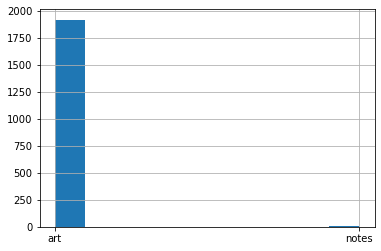

In [ ]:
drawings_df.label.hist()

<Axes: >

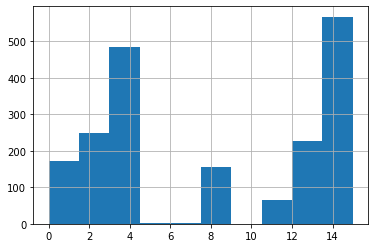

In [ ]:
drawings_df.cluster.hist()

In [ ]:
watercolors_df = cdf[cdf.handlabeled_metacluster_name == "1_watercolors"]
watercolors_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,indiv_fname,visual_rel_path,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped
idx,,,,,,,,,,,,,,,,,,,,,
4,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb07p104.jpg,art/sb07p104.jpg,art,xtra,4,"0.177406,0.008799,0.008245,0.017177,0.788373","-0.39105213,0.96309596,-0.73929733,0.4489988,0.8297614,-0.3937308,-0.7267234,-0.32461396,-0.7537334,-0.42715576,-0.62038505,-0.72562873,0.3037846,-0.6266761,-0.5213815,-0.31669965,-0.5467274,-0.6520286,-0.22544897,-0.6497359,-0.64108604,0.6374447,-0.5446661,-0.6779002,-0.14143991,-0.6690378,-0.44753593,0.66945183,-0.73986673,-0.45211998,-0.05996394,-0.21525535,0.82928157,-0.04412651,-0.600525,-0.04148197,-0.73825717,-0.57338566,-0.25227422,2.3566113,-0.61049384,1.0027854,-0.40134108,1.3733256,-0.75794554,-0.59257406,-0.4395525,-0.6001429,1.0358506,1.1911299,0.8162154,0.032713354,-0.6482407...",5,238.33170,1,...,sb07p104.jpg,1_watercolors/sb07p104.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb07p104.jpg,1_watercolors/sb07p104.jpg,1_watercolors,1,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/1_watercolors/sb07p104.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/1_watercolors/sb07p104.jpg,"-0.6198182,0.8895926,-0.73929733,0.6418346,0.46164584,1.0085131,-0.7267234,-0.4896673,-0.7537334,-0.42715576,-0.62038505,-0.72562873,1.4399182,-0.6266761,0.474914,-0.57515705,-0.5467274,-0.6520286,1.2274435,-0.6497359,-0.27622125,-0.45870692,-0.5446661,-0.6779002,1.3343718,-0.6690378,-0.4518578,0.42277813,-0.73986673,-0.45211998,1.6291834,-0.67007643,-0.09817025,-0.00090405345,-0.600525,-0.6186755,-0.73933,-0.57338566,0.006386578,1.034553,-0.61049384,-0.58021957,-0.09483403,0.78779536,-0.73080033,0.10947651,0.3367887,-0.5382227,-0.26548737,0.5630663,2.15088,0.2266624,-0.6482407,0.049348265..."
5,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb31p017.jpg,art/sb31p017.jpg,art,xtra,4,"0.172119,0.008924,0.008226,0.016950,0.793781","-0.05104202,-0.3935787,-0.73929733,0.86878717,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.14799604,-0.62038505,-0.72562873,-0.2654881,-0.6266761,-0.68991846,-0.57515705,-0.41532665,-0.6520286,-0.6898426,-0.34099144,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.2674706,-0.53598946,-0.13334358,-0.5982413,-0.73986673,-0.45211998,-0.68509877,0.033780396,-0.52171326,0.054827005,-0.20721096,0.3301326,-0.73933,-0.57338566,0.34032136,-0.6179389,-0.20170414,0.16225064,-0.44437563,0.44581896,-0.069196045,0.20976627,-0.07846111,-0.6001429,0.38122594,-0.09738222,-0.59497476,-0.665527...",11,191.66959,1,...,sb31p017.jpg,1_watercolors/sb31p017.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb31p017.jpg,1_watercolors/sb31p017.jpg,1_watercolors,1,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/1_watercolors/sb31p017.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/1_watercolors/sb31p017.jpg,"1.491735,-0.5714155,-0.73929733,0.05867392,0.5154146,0.0936929,-0.7267234,-0.4896673,0.4246894,-0.42715576,-0.33477074,-0.72562873,1.2274611,-0.6266761,-0.68991846,-0.57515705,-0.5467274,1.1312869,-0.06054777,-0.028933167,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,0.46393585,0.4817328,0.22738433,-0.73986673,-0.45211998,0.0057709217,-0.67007643,-0.52171326,0.68283725,0.060967267,0.7253895,-0.73933,-0.57338566,-0.65925777,-0.6179389,-0.32987997,0.86336035,-0.6189488,1.3613329,1.2250904,-0.59257406,-0.5857397,-0.6001429,-0.5687719,-0.14814761,0.5325973,-0.66552746,-0.6482407,0...."
21,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb05p079.jpg,art/sb05p0

In [ ]:
watercolors_df.set_index(pd.Index(range(len(watercolors_df))), inplace=True)
watercolors_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,indiv_fname,visual_rel_path,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb07p104.jpg,art/sb07p104.jpg,art,xtra,4,"0.177406,0.008799,0.008245,0.017177,0.788373","-0.39105213,0.96309596,-0.73929733,0.4489988,0.8297614,-0.3937308,-0.7267234,-0.32461396,-0.7537334,-0.42715576,-0.62038505,-0.72562873,0.3037846,-0.6266761,-0.5213815,-0.31669965,-0.5467274,-0.6520286,-0.22544897,-0.6497359,-0.64108604,0.6374447,-0.5446661,-0.6779002,-0.14143991,-0.6690378,-0.44753593,0.66945183,-0.73986673,-0.45211998,-0.05996394,-0.21525535,0.82928157,-0.04412651,-0.600525,-0.04148197,-0.73825717,-0.57338566,-0.25227422,2.3566113,-0.61049384,1.0027854,-0.40134108,1.3733256,-0.75794554,-0.59257406,-0.4395525,-0.6001429,1.0358506,1.1911299,0.8162154,0.032713354,-0.6482407...",5,238.33170,1,...,sb07p104.jpg,1_watercolors/sb07p104.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb07p104.jpg,1_watercolors/sb07p104.jpg,1_watercolors,1,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/1_watercolors/sb07p104.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/1_watercolors/sb07p104.jpg,"-0.6198182,0.8895926,-0.73929733,0.6418346,0.46164584,1.0085131,-0.7267234,-0.4896673,-0.7537334,-0.42715576,-0.62038505,-0.72562873,1.4399182,-0.6266761,0.474914,-0.57515705,-0.5467274,-0.6520286,1.2274435,-0.6497359,-0.27622125,-0.45870692,-0.5446661,-0.6779002,1.3343718,-0.6690378,-0.4518578,0.42277813,-0.73986673,-0.45211998,1.6291834,-0.67007643,-0.09817025,-0.00090405345,-0.600525,-0.6186755,-0.73933,-0.57338566,0.006386578,1.034553,-0.61049384,-0.58021957,-0.09483403,0.78779536,-0.73080033,0.10947651,0.3367887,-0.5382227,-0.26548737,0.5630663,2.15088,0.2266624,-0.6482407,0.049348265..."
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb31p017.jpg,art/sb31p017.jpg,art,xtra,4,"0.172119,0.008924,0.008226,0.016950,0.793781","-0.05104202,-0.3935787,-0.73929733,0.86878717,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.14799604,-0.62038505,-0.72562873,-0.2654881,-0.6266761,-0.68991846,-0.57515705,-0.41532665,-0.6520286,-0.6898426,-0.34099144,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.2674706,-0.53598946,-0.13334358,-0.5982413,-0.73986673,-0.45211998,-0.68509877,0.033780396,-0.52171326,0.054827005,-0.20721096,0.3301326,-0.73933,-0.57338566,0.34032136,-0.6179389,-0.20170414,0.16225064,-0.44437563,0.44581896,-0.069196045,0.20976627,-0.07846111,-0.6001429,0.38122594,-0.09738222,-0.59497476,-0.665527...",11,191.66959,1,...,sb31p017.jpg,1_watercolors/sb31p017.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb31p017.jpg,1_watercolors/sb31p017.jpg,1_watercolors,1,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/1_watercolors/sb31p017.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/1_watercolors/sb31p017.jpg,"1.491735,-0.5714155,-0.73929733,0.05867392,0.5154146,0.0936929,-0.7267234,-0.4896673,0.4246894,-0.42715576,-0.33477074,-0.72562873,1.2274611,-0.6266761,-0.68991846,-0.57515705,-0.5467274,1.1312869,-0.06054777,-0.028933167,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,0.46393585,0.4817328,0.22738433,-0.73986673,-0.45211998,0.0057709217,-0.67007643,-0.52171326,0.68283725,0.060967267,0.7253895,-0.73933,-0.57338566,-0.65925777,-0.6179389,-0.32987997,0.86336035,-0.6189488,1.3613329,1.2250904,-0.59257406,-0.5857397,-0.6001429,-0.5687719,-0.14814761,0.5325973,-0.66552746,-0.6482407,0...."
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb05p079.jpg,art/sb05p079.jpg,art,xtra,4,"0.17215

<Axes: >

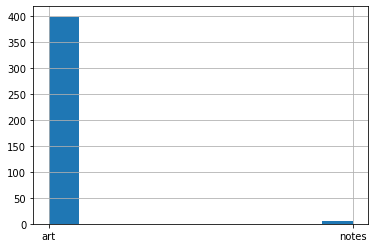

In [ ]:
watercolors_df.label.hist()

<Axes: >

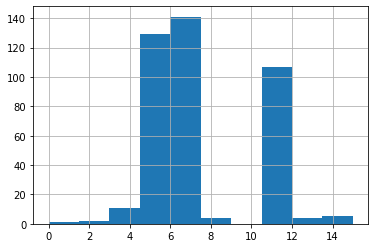

In [ ]:
watercolors_df.cluster.hist()

In [ ]:
drawings_tsv_fname = f"{preprocessing_dir}/drawings.tsv"
drawings_df.to_csv(
    drawings_tsv_fname, index=True, index_label="idx", sep="\t", header=True
)
drawing_df = pd.read_csv(drawings_tsv_fname, delimiter="\t", index_col="idx")
drawing_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,indiv_fname,visual_rel_path,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped
idx,,,,,,,,,,,,,,,,,,,,,
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,sb77p043.jpg,1_watercolors/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb77p043.jpg,0_drawings/sb77p043.jpg,0_drawings,0,False,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb77p043.jpg,"-0.6198182,-0.5714155,0.2937309,0.2691822,-0.6254566,-0.46855158,-0.7267234,-0.4896673,-0.7537334,-0.42715576,2.241211,-0.013144195,-0.30681813,-0.6266761,0.43516117,-0.57515705,-0.5467274,-0.5245168,1.3334948,2.1400952,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.6690378,0.38178188,-0.5982413,-0.50063276,-0.21540937,0.4948988,-0.67007643,-0.52171326,-0.4592305,1.8570362,-0.6186755,0.94023055,-0.57338566,0.5270257,-0.6179389,2.302543,1.1004333,0.15528035,-0.6682474,1.890626,-0.59257406,1.331521,-0.6001429,1.5220151,0.93749076,-0.59497476,-0.66552746,-0.6482407,-0.4732165,0...."
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,sb67p021.jpg,0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb67p021.jpg,0_drawings/sb67p021.jpg,0_drawings,0,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb67p021.jpg,"-0.20756221,-0.24843562,0.29454154,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,0.9697293,-0.72562873,-0.662768,-0.6266761,-0.23836556,0.4814458,-0.5467274,-0.6520286,0.838902,-0.6497359,-0.57338166,-0.55193967,-0.5446661,-0.28419846,1.6012006,-0.6690378,-0.4518578,-0.0104218125,-0.73986673,-0.3002332,-0.68509877,-0.67007643,-0.36297536,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,-0.65925777,1.6904012,-0.61049384,-0.58021957,0.508085,0.14767355,0.8082305,-0.59257406,-0.6157326,-0.6001429,-0.651804,-0.30467254,0.17396247,-0.66552746,-0.6482407,-0.0..."
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.

In [ ]:
watercolors_tsv_fname = f"{preprocessing_dir}/watercolors.tsv"
watercolors_df.to_csv(
    watercolors_tsv_fname, index=True, index_label="idx", sep="\t", header=True
)
watercolor_df = pd.read_csv(watercolors_tsv_fname, delimiter="\t", index_col="idx")
watercolor_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,indiv_fname,visual_rel_path,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped
idx,,,,,,,,,,,,,,,,,,,,,
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb07p104.jpg,art/sb07p104.jpg,art,xtra,4,"0.177406,0.008799,0.008245,0.017177,0.788373","-0.39105213,0.96309596,-0.73929733,0.4489988,0.8297614,-0.3937308,-0.7267234,-0.32461396,-0.7537334,-0.42715576,-0.62038505,-0.72562873,0.3037846,-0.6266761,-0.5213815,-0.31669965,-0.5467274,-0.6520286,-0.22544897,-0.6497359,-0.64108604,0.6374447,-0.5446661,-0.6779002,-0.14143991,-0.6690378,-0.44753593,0.66945183,-0.73986673,-0.45211998,-0.05996394,-0.21525535,0.82928157,-0.04412651,-0.600525,-0.04148197,-0.73825717,-0.57338566,-0.25227422,2.3566113,-0.61049384,1.0027854,-0.40134108,1.3733256,-0.75794554,-0.59257406,-0.4395525,-0.6001429,1.0358506,1.1911299,0.8162154,0.032713354,-0.6482407...",5,238.33170,1,...,sb07p104.jpg,1_watercolors/sb07p104.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb07p104.jpg,1_watercolors/sb07p104.jpg,1_watercolors,1,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/1_watercolors/sb07p104.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/1_watercolors/sb07p104.jpg,"-0.6198182,0.8895926,-0.73929733,0.6418346,0.46164584,1.0085131,-0.7267234,-0.4896673,-0.7537334,-0.42715576,-0.62038505,-0.72562873,1.4399182,-0.6266761,0.474914,-0.57515705,-0.5467274,-0.6520286,1.2274435,-0.6497359,-0.27622125,-0.45870692,-0.5446661,-0.6779002,1.3343718,-0.6690378,-0.4518578,0.42277813,-0.73986673,-0.45211998,1.6291834,-0.67007643,-0.09817025,-0.00090405345,-0.600525,-0.6186755,-0.73933,-0.57338566,0.006386578,1.034553,-0.61049384,-0.58021957,-0.09483403,0.78779536,-0.73080033,0.10947651,0.3367887,-0.5382227,-0.26548737,0.5630663,2.15088,0.2266624,-0.6482407,0.049348265..."
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb31p017.jpg,art/sb31p017.jpg,art,xtra,4,"0.172119,0.008924,0.008226,0.016950,0.793781","-0.05104202,-0.3935787,-0.73929733,0.86878717,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.14799604,-0.62038505,-0.72562873,-0.2654881,-0.6266761,-0.68991846,-0.57515705,-0.41532665,-0.6520286,-0.6898426,-0.34099144,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.2674706,-0.53598946,-0.13334358,-0.5982413,-0.73986673,-0.45211998,-0.68509877,0.033780396,-0.52171326,0.054827005,-0.20721096,0.3301326,-0.73933,-0.57338566,0.34032136,-0.6179389,-0.20170414,0.16225064,-0.44437563,0.44581896,-0.069196045,0.20976627,-0.07846111,-0.6001429,0.38122594,-0.09738222,-0.59497476,-0.665527...",11,191.66959,1,...,sb31p017.jpg,1_watercolors/sb31p017.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb31p017.jpg,1_watercolors/sb31p017.jpg,1_watercolors,1,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/1_watercolors/sb31p017.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/1_watercolors/sb31p017.jpg,"1.491735,-0.5714155,-0.73929733,0.05867392,0.5154146,0.0936929,-0.7267234,-0.4896673,0.4246894,-0.42715576,-0.33477074,-0.72562873,1.2274611,-0.6266761,-0.68991846,-0.57515705,-0.5467274,1.1312869,-0.06054777,-0.028933167,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,0.46393585,0.4817328,0.22738433,-0.73986673,-0.45211998,0.0057709217,-0.67007643,-0.52171326,0.68283725,0.060967267,0.7253895,-0.73933,-0.57338566,-0.65925777,-0.6179389,-0.32987997,0.86336035,-0.6189488,1.3613329,1.2250904,-0.59257406,-0.5857397,-0.6001429,-0.5687719,-0.14814761,0.5325973,-0.66552746,-0.6482407,0...."
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb05p079.jpg,art/sb05p07

In [ ]:
drawings_emb = np.stack(
    [np.array([float(f) for f in s.split(",")]) for s in list(drawings_df.emb_csv)]
).astype(np.float32)

drawings_cropped_emb = np.stack(
    [
        np.array([float(f) for f in s.split(",")])
        for s in list(drawings_df.emb_csv_cropped)
    ]
).astype(np.float32)

drawings_emb.shape, drawings_cropped_emb.shape

((1923, 512), (1923, 512))

In [ ]:
watercolors_emb = np.stack(
    [np.array([float(f) for f in s.split(",")]) for s in list(watercolors_df.emb_csv)]
).astype(np.float32)

watercolors_cropped_emb = np.stack(
    [
        np.array([float(f) for f in s.split(",")])
        for s in list(watercolors_df.emb_csv_cropped)
    ]
).astype(np.float32)

watercolors_emb.shape, watercolors_cropped_emb.shape

((404, 512), (404, 512))

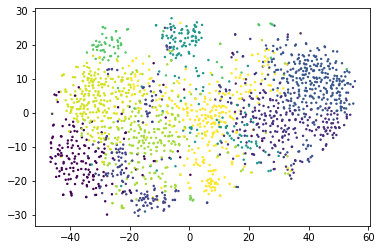

In [ ]:
drawings_X_tsne = TSNE(n_components=2, random_state=42).fit_transform(drawings_emb)
fig = plt.scatter(
    x=drawings_X_tsne[:, 0], y=drawings_X_tsne[:, 1], c=drawings_df.cluster, s=2.0
)

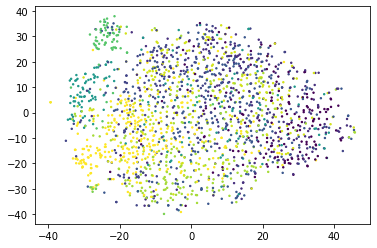

In [ ]:
drawings_cropped_X_tsne = TSNE(n_components=2, random_state=42).fit_transform(
    drawings_cropped_emb
)
fig = plt.scatter(
    x=drawings_cropped_X_tsne[:, 0],
    y=drawings_cropped_X_tsne[:, 1],
    c=drawings_df.cluster,
    s=2.0,
)

In [ ]:
drawings_index = faiss.IndexFlatL2(emb_dim)
drawings_index.add(drawings_emb)

drawings_cropped_index = faiss.IndexFlatL2(emb_dim)
drawings_cropped_index.add(drawings_cropped_emb)

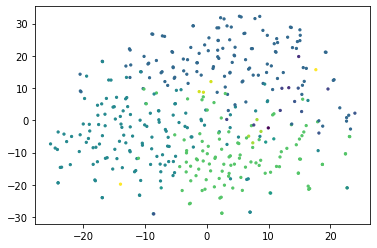

In [ ]:
watercolors_X_tsne = TSNE(n_components=2, random_state=42).fit_transform(
    watercolors_emb
)
fig = plt.scatter(
    x=watercolors_X_tsne[:, 0],
    y=watercolors_X_tsne[:, 1],
    c=watercolors_df.cluster,
    s=5.0,
)

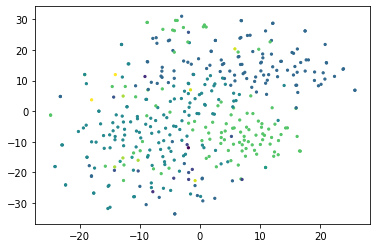

In [ ]:
watercolors_cropped_X_tsne = TSNE(n_components=2, random_state=42).fit_transform(
    watercolors_cropped_emb
)
fig = plt.scatter(
    x=watercolors_cropped_X_tsne[:, 0],
    y=watercolors_cropped_X_tsne[:, 1],
    c=watercolors_df.cluster,
    s=5.0,
)

In [ ]:
watercolors_index = faiss.IndexFlatL2(emb_dim)
watercolors_index.add(watercolors_emb)

watercolors_cropped_index = faiss.IndexFlatL2(emb_dim)
watercolors_cropped_index.add(watercolors_cropped_emb)

### drawings_emb

In [ ]:
drawings_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,visual_rel_path,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped,drawings_cluster_id
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,1_watercolors/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb77p043.jpg,0_drawings/sb77p043.jpg,0_drawings,0,False,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb77p043.jpg,"-0.6198182,-0.5714155,0.2937309,0.2691822,-0.6254566,-0.46855158,-0.7267234,-0.4896673,-0.7537334,-0.42715576,2.241211,-0.013144195,-0.30681813,-0.6266761,0.43516117,-0.57515705,-0.5467274,-0.5245168,1.3334948,2.1400952,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.6690378,0.38178188,-0.5982413,-0.50063276,-0.21540937,0.4948988,-0.67007643,-0.52171326,-0.4592305,1.8570362,-0.6186755,0.94023055,-0.57338566,0.5270257,-0.6179389,2.302543,1.1004333,0.15528035,-0.6682474,1.890626,-0.59257406,1.331521,-0.6001429,1.5220151,0.93749076,-0.59497476,-0.66552746,-0.6482407,-0.4732165,0....",3
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb67p021.jpg,0_drawings/sb67p021.jpg,0_drawings,0,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb67p021.jpg,"-0.20756221,-0.24843562,0.29454154,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,0.9697293,-0.72562873,-0.662768,-0.6266761,-0.23836556,0.4814458,-0.5467274,-0.6520286,0.838902,-0.6497359,-0.57338166,-0.55193967,-0.5446661,-0.28419846,1.6012006,-0.6690378,-0.4518578,-0.0104218125,-0.73986673,-0.3002332,-0.68509877,-0.67007643,-0.36297536,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,-0.65925777,1.6904012,-0.61049384,-0.58021957,0.508085,0.14767355,0.8082305,-0.59257406,-0.6157326,-0.6001429,-0.651804,-0.30467254,0.17396247,-0.66552746,-0.6482407,-0.0...",2
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3

In [ ]:
drawings_df = drawings_df.reindex()

In [ ]:
drawings_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,visual_rel_path,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped,drawings_cluster_id
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,1_watercolors/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb77p043.jpg,0_drawings/sb77p043.jpg,0_drawings,0,False,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb77p043.jpg,"-0.6198182,-0.5714155,0.2937309,0.2691822,-0.6254566,-0.46855158,-0.7267234,-0.4896673,-0.7537334,-0.42715576,2.241211,-0.013144195,-0.30681813,-0.6266761,0.43516117,-0.57515705,-0.5467274,-0.5245168,1.3334948,2.1400952,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.6690378,0.38178188,-0.5982413,-0.50063276,-0.21540937,0.4948988,-0.67007643,-0.52171326,-0.4592305,1.8570362,-0.6186755,0.94023055,-0.57338566,0.5270257,-0.6179389,2.302543,1.1004333,0.15528035,-0.6682474,1.890626,-0.59257406,1.331521,-0.6001429,1.5220151,0.93749076,-0.59497476,-0.66552746,-0.6482407,-0.4732165,0....",3
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb67p021.jpg,0_drawings/sb67p021.jpg,0_drawings,0,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb67p021.jpg,"-0.20756221,-0.24843562,0.29454154,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,0.9697293,-0.72562873,-0.662768,-0.6266761,-0.23836556,0.4814458,-0.5467274,-0.6520286,0.838902,-0.6497359,-0.57338166,-0.55193967,-0.5446661,-0.28419846,1.6012006,-0.6690378,-0.4518578,-0.0104218125,-0.73986673,-0.3002332,-0.68509877,-0.67007643,-0.36297536,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,-0.65925777,1.6904012,-0.61049384,-0.58021957,0.508085,0.14767355,0.8082305,-0.59257406,-0.6157326,-0.6001429,-0.651804,-0.30467254,0.17396247,-0.66552746,-0.6482407,-0.0...",2
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3

In [ ]:
ncentroids = 8
niter = 20
verbose = False
drawings_kmeans = faiss.Kmeans(
    drawings_emb.shape[1], ncentroids, niter=niter, verbose=verbose, gpu=True
)
drawings_kmeans.train(drawings_emb)
drawings_D, drawings_I = drawings_index.search(drawings_kmeans.centroids, 16)

drawings_kD, drawings_kI = drawings_kmeans.index.search(drawings_emb, 1)
drawings_df.loc[:, "drawings_cluster_id"] = drawings_kI
drawings_df.loc[:, "drawings_cluster_dist"] = drawings_kD
drawings_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped,drawings_cluster_id,drawings_cluster_dist
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb77p043.jpg,0_drawings/sb77p043.jpg,0_drawings,0,False,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb77p043.jpg,"-0.6198182,-0.5714155,0.2937309,0.2691822,-0.6254566,-0.46855158,-0.7267234,-0.4896673,-0.7537334,-0.42715576,2.241211,-0.013144195,-0.30681813,-0.6266761,0.43516117,-0.57515705,-0.5467274,-0.5245168,1.3334948,2.1400952,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.6690378,0.38178188,-0.5982413,-0.50063276,-0.21540937,0.4948988,-0.67007643,-0.52171326,-0.4592305,1.8570362,-0.6186755,0.94023055,-0.57338566,0.5270257,-0.6179389,2.302543,1.1004333,0.15528035,-0.6682474,1.890626,-0.59257406,1.331521,-0.6001429,1.5220151,0.93749076,-0.59497476,-0.66552746,-0.6482407,-0.4732165,0....",3,217.249588
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/0_drawings/sb67p021.jpg,0_drawings/sb67p021.jpg,0_drawings,0,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb67p021.jpg,"-0.20756221,-0.24843562,0.29454154,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,0.9697293,-0.72562873,-0.662768,-0.6266761,-0.23836556,0.4814458,-0.5467274,-0.6520286,0.838902,-0.6497359,-0.57338166,-0.55193967,-0.5446661,-0.28419846,1.6012006,-0.6690378,-0.4518578,-0.0104218125,-0.73986673,-0.3002332,-0.68509877,-0.67007643,-0.36297536,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,-0.65925777,1.6904012,-0.61049384,-0.58021957,0.508085,0.14767355,0.8082305,-0.59257406,-0.6157326,-0.6001429,-0.651804,-0.30467254,0.17396247,-0.66552746,-0.6482407,-0.0...",2,169.947693
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3776337,-0.5714155,-0.25

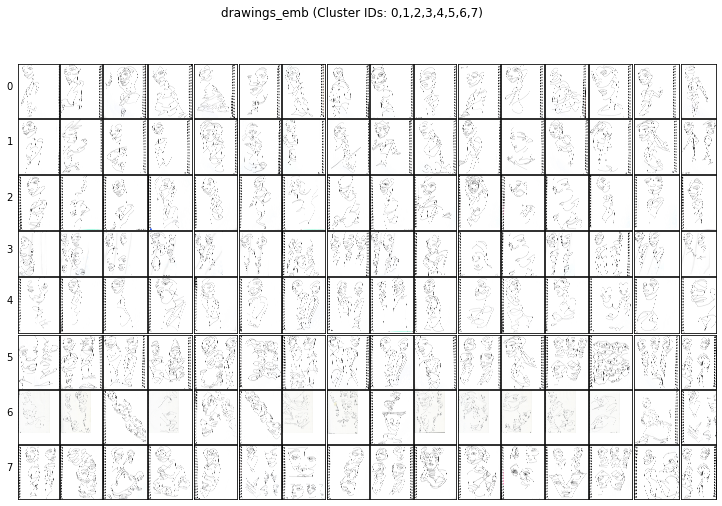

In [ ]:
show_all_clusters(clusters_df=drawings_df, clusters=drawings_I, title="drawings_emb")

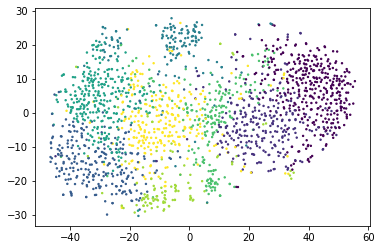

In [ ]:
fig = plt.scatter(
    x=drawings_X_tsne[:, 0],
    y=drawings_X_tsne[:, 1],
    c=drawings_df.drawings_cluster_id,
    s=2.0,
)

### drawings_emb_cropped

In [ ]:
ncentroids = 8
niter = 20
verbose = False
drawings_cropped_kmeans = faiss.Kmeans(
    drawings_cropped_emb.shape[1], ncentroids, niter=niter, verbose=verbose, gpu=True
)
drawings_cropped_kmeans.train(drawings_cropped_emb)
drawings_cropped_D, drawings_cropped_I = drawings_cropped_index.search(
    drawings_cropped_kmeans.centroids, 16
)

drawings_cropped_kD, drawings_cropped_kI = drawings_cropped_kmeans.index.search(
    drawings_cropped_emb, 1
)
drawings_df.loc[:, "drawings_cropped_cluster_id"] = drawings_cropped_kI
drawings_df.loc[:, "drawings_cropped_cluster_dist"] = drawings_cropped_kD
drawings_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped,drawings_cluster_id,drawings_cluster_dist,drawings_cropped_cluster_id,drawings_cropped_cluster_dist
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,0_drawings,0,False,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb77p043.jpg,"-0.6198182,-0.5714155,0.2937309,0.2691822,-0.6254566,-0.46855158,-0.7267234,-0.4896673,-0.7537334,-0.42715576,2.241211,-0.013144195,-0.30681813,-0.6266761,0.43516117,-0.57515705,-0.5467274,-0.5245168,1.3334948,2.1400952,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.6690378,0.38178188,-0.5982413,-0.50063276,-0.21540937,0.4948988,-0.67007643,-0.52171326,-0.4592305,1.8570362,-0.6186755,0.94023055,-0.57338566,0.5270257,-0.6179389,2.302543,1.1004333,0.15528035,-0.6682474,1.890626,-0.59257406,1.331521,-0.6001429,1.5220151,0.93749076,-0.59497476,-0.66552746,-0.6482407,-0.4732165,0....",3,217.249588,5,332.983734
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,0_drawings,0,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb67p021.jpg,"-0.20756221,-0.24843562,0.29454154,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,0.9697293,-0.72562873,-0.662768,-0.6266761,-0.23836556,0.4814458,-0.5467274,-0.6520286,0.838902,-0.6497359,-0.57338166,-0.55193967,-0.5446661,-0.28419846,1.6012006,-0.6690378,-0.4518578,-0.0104218125,-0.73986673,-0.3002332,-0.68509877,-0.67007643,-0.36297536,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,-0.65925777,1.6904012,-0.61049384,-0.58021957,0.508085,0.14767355,0.8082305,-0.59257406,-0.6157326,-0.6001429,-0.651804,-0.30467254,0.17396247,-0.66552746,-0.6482407,-0.0...",2,169.947693,5,126.699768
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3776337,-0.5714155,-0.2587232,-0.6553513,1.3532461,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.25077122,0.050992966,-0.72562873,0.1406585,-0.6266761,1.0653365,0.96198404,-0.5467274,0.30261123,0.6327609,-0.6497359,-0.64108604,-0.

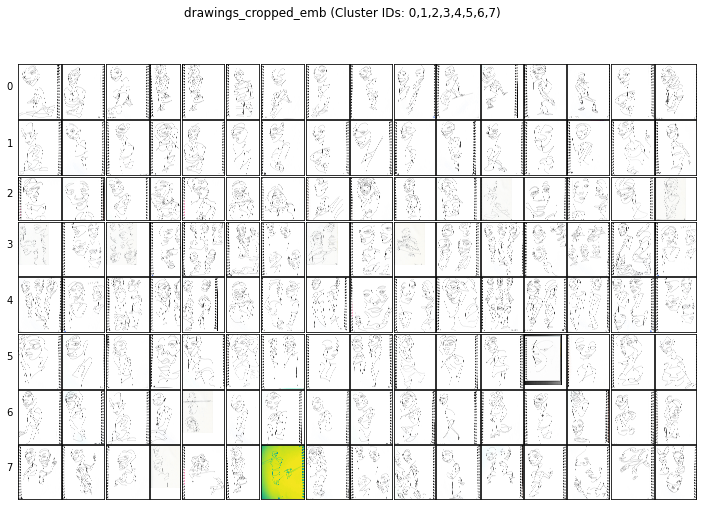

In [ ]:
show_all_clusters(
    clusters_df=drawings_df, clusters=drawings_cropped_I, title="drawings_cropped_emb"
)

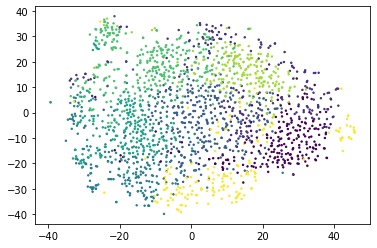

In [ ]:
fig = plt.scatter(
    x=drawings_cropped_X_tsne[:, 0],
    y=drawings_cropped_X_tsne[:, 1],
    c=drawings_df.drawings_cropped_cluster_id,
    s=2.0,
)

### watercolors_emb

In [ ]:
watercolors_df = watercolors_df.reindex()

In [ ]:
ncentroids = 8
niter = 20
verbose = False
watercolors_kmeans = faiss.Kmeans(
    watercolors_emb.shape[1], ncentroids, niter=niter, verbose=verbose, gpu=True
)
watercolors_kmeans.train(watercolors_emb)
watercolors_D, watercolors_I = watercolors_index.search(
    watercolors_kmeans.centroids, 16
)

watercolors_kD, watercolors_kI = watercolors_kmeans.index.search(watercolors_emb, 1)
watercolors_df.loc[:, "watercolors_cluster_id"] = watercolors_kI
watercolors_df.loc[:, "watercolors_cluster_dist"] = watercolors_kD
watercolors_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,visual_abs_path,handlabeled_rel_path,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped,watercolors_cluster_id,watercolors_cluster_dist
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb07p104.jpg,art/sb07p104.jpg,art,xtra,4,"0.177406,0.008799,0.008245,0.017177,0.788373","-0.39105213,0.96309596,-0.73929733,0.4489988,0.8297614,-0.3937308,-0.7267234,-0.32461396,-0.7537334,-0.42715576,-0.62038505,-0.72562873,0.3037846,-0.6266761,-0.5213815,-0.31669965,-0.5467274,-0.6520286,-0.22544897,-0.6497359,-0.64108604,0.6374447,-0.5446661,-0.6779002,-0.14143991,-0.6690378,-0.44753593,0.66945183,-0.73986673,-0.45211998,-0.05996394,-0.21525535,0.82928157,-0.04412651,-0.600525,-0.04148197,-0.73825717,-0.57338566,-0.25227422,2.3566113,-0.61049384,1.0027854,-0.40134108,1.3733256,-0.75794554,-0.59257406,-0.4395525,-0.6001429,1.0358506,1.1911299,0.8162154,0.032713354,-0.6482407...",5,238.33170,1,...,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb07p104.jpg,1_watercolors/sb07p104.jpg,1_watercolors,1,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/1_watercolors/sb07p104.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/1_watercolors/sb07p104.jpg,"-0.6198182,0.8895926,-0.73929733,0.6418346,0.46164584,1.0085131,-0.7267234,-0.4896673,-0.7537334,-0.42715576,-0.62038505,-0.72562873,1.4399182,-0.6266761,0.474914,-0.57515705,-0.5467274,-0.6520286,1.2274435,-0.6497359,-0.27622125,-0.45870692,-0.5446661,-0.6779002,1.3343718,-0.6690378,-0.4518578,0.42277813,-0.73986673,-0.45211998,1.6291834,-0.67007643,-0.09817025,-0.00090405345,-0.600525,-0.6186755,-0.73933,-0.57338566,0.006386578,1.034553,-0.61049384,-0.58021957,-0.09483403,0.78779536,-0.73080033,0.10947651,0.3367887,-0.5382227,-0.26548737,0.5630663,2.15088,0.2266624,-0.6482407,0.049348265...",7,215.029266
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb31p017.jpg,art/sb31p017.jpg,art,xtra,4,"0.172119,0.008924,0.008226,0.016950,0.793781","-0.05104202,-0.3935787,-0.73929733,0.86878717,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.14799604,-0.62038505,-0.72562873,-0.2654881,-0.6266761,-0.68991846,-0.57515705,-0.41532665,-0.6520286,-0.6898426,-0.34099144,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.2674706,-0.53598946,-0.13334358,-0.5982413,-0.73986673,-0.45211998,-0.68509877,0.033780396,-0.52171326,0.054827005,-0.20721096,0.3301326,-0.73933,-0.57338566,0.34032136,-0.6179389,-0.20170414,0.16225064,-0.44437563,0.44581896,-0.069196045,0.20976627,-0.07846111,-0.6001429,0.38122594,-0.09738222,-0.59497476,-0.665527...",11,191.66959,1,...,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/02_VISUAL_CATEGORIES/1_watercolors/sb31p017.jpg,1_watercolors/sb31p017.jpg,1_watercolors,1,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/1_watercolors/sb31p017.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/1_watercolors/sb31p017.jpg,"1.491735,-0.5714155,-0.73929733,0.05867392,0.5154146,0.0936929,-0.7267234,-0.4896673,0.4246894,-0.42715576,-0.33477074,-0.72562873,1.2274611,-0.6266761,-0.68991846,-0.57515705,-0.5467274,1.1312869,-0.06054777,-0.028933167,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,0.46393585,0.4817328,0.22738433,-0.73986673,-0.45211998,0.0057709217,-0.67007643,-0.52171326,0.68283725,0.060967267,0.7253895,-0.73933,-0.57338566,-0.65925777,-0.6179389,-0.32987997,0.86336035,-0.6189488,1.3613329,1.2250904,-0.59257406,-0.5857397,-0.6001429,-0.5687719,-0.14814761,0.5325973,-0.66552746,-0.6482407,0....",4,199.030975
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb05p079.jpg,art/sb05p079.jpg,art,xtra,4,"0.172158,0.008873,0.008536,0.017017,0.793

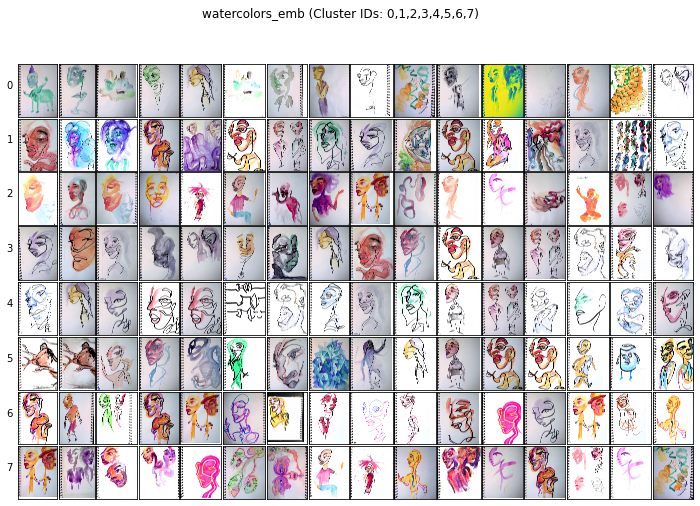

In [ ]:
show_all_clusters(
    clusters_df=watercolors_df, clusters=watercolors_I, title="watercolors_emb"
)

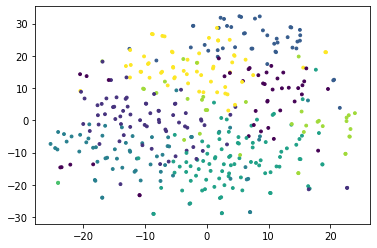

In [ ]:
fig = plt.scatter(
    x=watercolors_X_tsne[:, 0],
    y=watercolors_X_tsne[:, 1],
    c=watercolors_df.watercolors_cluster_id,
    s=8.0,
)

### watercolors_emb_cropped

In [ ]:
ncentroids = 8
niter = 20
verbose = False
watercolors_cropped_kmeans = faiss.Kmeans(
    watercolors_cropped_emb.shape[1], ncentroids, niter=niter, verbose=verbose, gpu=True
)
watercolors_cropped_kmeans.train(watercolors_cropped_emb)
watercolors_cropped_D, watercolors_cropped_I = watercolors_cropped_index.search(
    watercolors_cropped_kmeans.centroids, 16
)

(
    watercolors_cropped_kD,
    watercolors_cropped_kI,
) = watercolors_cropped_kmeans.index.search(watercolors_cropped_emb, 1)
watercolors_df.loc[:, "watercolors_cropped_cluster_id"] = watercolors_cropped_kI
watercolors_df.loc[:, "watercolors_cropped_cluster_dist"] = watercolors_cropped_kD
watercolors_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped,watercolors_cluster_id,watercolors_cluster_dist,watercolors_cropped_cluster_id,watercolors_cropped_cluster_dist
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb07p104.jpg,art/sb07p104.jpg,art,xtra,4,"0.177406,0.008799,0.008245,0.017177,0.788373","-0.39105213,0.96309596,-0.73929733,0.4489988,0.8297614,-0.3937308,-0.7267234,-0.32461396,-0.7537334,-0.42715576,-0.62038505,-0.72562873,0.3037846,-0.6266761,-0.5213815,-0.31669965,-0.5467274,-0.6520286,-0.22544897,-0.6497359,-0.64108604,0.6374447,-0.5446661,-0.6779002,-0.14143991,-0.6690378,-0.44753593,0.66945183,-0.73986673,-0.45211998,-0.05996394,-0.21525535,0.82928157,-0.04412651,-0.600525,-0.04148197,-0.73825717,-0.57338566,-0.25227422,2.3566113,-0.61049384,1.0027854,-0.40134108,1.3733256,-0.75794554,-0.59257406,-0.4395525,-0.6001429,1.0358506,1.1911299,0.8162154,0.032713354,-0.6482407...",5,238.33170,1,...,1_watercolors,1,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/1_watercolors/sb07p104.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/1_watercolors/sb07p104.jpg,"-0.6198182,0.8895926,-0.73929733,0.6418346,0.46164584,1.0085131,-0.7267234,-0.4896673,-0.7537334,-0.42715576,-0.62038505,-0.72562873,1.4399182,-0.6266761,0.474914,-0.57515705,-0.5467274,-0.6520286,1.2274435,-0.6497359,-0.27622125,-0.45870692,-0.5446661,-0.6779002,1.3343718,-0.6690378,-0.4518578,0.42277813,-0.73986673,-0.45211998,1.6291834,-0.67007643,-0.09817025,-0.00090405345,-0.600525,-0.6186755,-0.73933,-0.57338566,0.006386578,1.034553,-0.61049384,-0.58021957,-0.09483403,0.78779536,-0.73080033,0.10947651,0.3367887,-0.5382227,-0.26548737,0.5630663,2.15088,0.2266624,-0.6482407,0.049348265...",7,215.029266,7,206.641174
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb31p017.jpg,art/sb31p017.jpg,art,xtra,4,"0.172119,0.008924,0.008226,0.016950,0.793781","-0.05104202,-0.3935787,-0.73929733,0.86878717,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.14799604,-0.62038505,-0.72562873,-0.2654881,-0.6266761,-0.68991846,-0.57515705,-0.41532665,-0.6520286,-0.6898426,-0.34099144,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.2674706,-0.53598946,-0.13334358,-0.5982413,-0.73986673,-0.45211998,-0.68509877,0.033780396,-0.52171326,0.054827005,-0.20721096,0.3301326,-0.73933,-0.57338566,0.34032136,-0.6179389,-0.20170414,0.16225064,-0.44437563,0.44581896,-0.069196045,0.20976627,-0.07846111,-0.6001429,0.38122594,-0.09738222,-0.59497476,-0.665527...",11,191.66959,1,...,1_watercolors,1,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/1_watercolors/sb31p017.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/1_watercolors/sb31p017.jpg,"1.491735,-0.5714155,-0.73929733,0.05867392,0.5154146,0.0936929,-0.7267234,-0.4896673,0.4246894,-0.42715576,-0.33477074,-0.72562873,1.2274611,-0.6266761,-0.68991846,-0.57515705,-0.5467274,1.1312869,-0.06054777,-0.028933167,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,0.46393585,0.4817328,0.22738433,-0.73986673,-0.45211998,0.0057709217,-0.67007643,-0.52171326,0.68283725,0.060967267,0.7253895,-0.73933,-0.57338566,-0.65925777,-0.6179389,-0.32987997,0.86336035,-0.6189488,1.3613329,1.2250904,-0.59257406,-0.5857397,-0.6001429,-0.5687719,-0.14814761,0.5325973,-0.66552746,-0.6482407,0....",4,199.030975,4,195.975464
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb05p079.jpg,art/sb05p079.jpg,art,xtra,4,"0.172158,0.008873,0.008536,0.017017,0.793416","1.8089037,-0.5714155,-0.73929733,-0.10773122,-0.22753507,0.34884918,0.124596715,-0.4896673,-0.27447522,-0.42715576,0.61659455,-0.03226477,-0.662768,-0.6266761,-0.68991846,-0.57515705,-0.39897114,-0.6520286

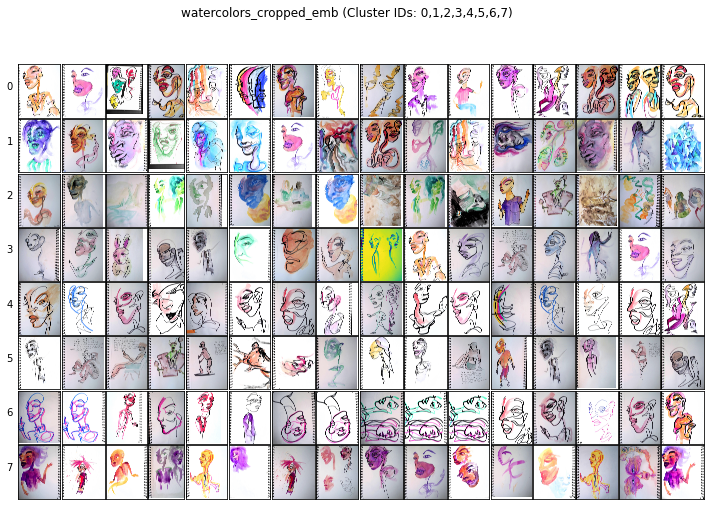

In [ ]:
show_all_clusters(
    clusters_df=watercolors_df,
    clusters=watercolors_cropped_I,
    title="watercolors_cropped_emb",
)

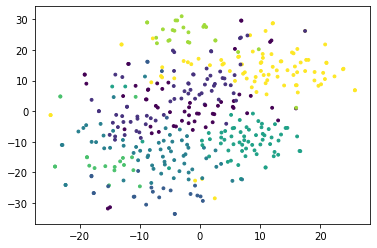

In [ ]:
fig = plt.scatter(
    x=watercolors_cropped_X_tsne[:, 0],
    y=watercolors_cropped_X_tsne[:, 1],
    c=watercolors_df.watercolors_cropped_cluster_id,
    s=8.0,
)

## side quest: varying the numbers of centroids for drawings

#### drawings_cluster16

In [ ]:
ncentroids = 16
niter = 20
verbose = False
drawings_cluster16_kmeans = faiss.Kmeans(
    drawings_emb.shape[1], ncentroids, niter=niter, verbose=verbose, gpu=True
)
drawings_cluster16_kmeans.train(drawings_emb)
drawings_cluster16_D, drawings_cluster16_I = drawings_index.search(
    drawings_cluster16_kmeans.centroids, 16
)

drawings_cluster16_kD, drawings_cluster16_kI = drawings_cluster16_kmeans.index.search(
    drawings_emb, 1
)
drawings_df.loc[:, "drawings_cluster16_id"] = drawings_cluster16_kI
drawings_df.loc[:, "drawings_cluster16_dist"] = drawings_cluster16_kD
drawings_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,handlabeled_abs_path,emb_csv_cropped,drawings_cluster_id,drawings_cluster_dist,drawings_cropped_cluster_id,drawings_cropped_cluster_dist,drawings_cluster32_id,drawings_cluster32_dist,drawings_cluster16_id,drawings_cluster16_dist
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb77p043.jpg,"-0.6198182,-0.5714155,0.2937309,0.2691822,-0.6254566,-0.46855158,-0.7267234,-0.4896673,-0.7537334,-0.42715576,2.241211,-0.013144195,-0.30681813,-0.6266761,0.43516117,-0.57515705,-0.5467274,-0.5245168,1.3334948,2.1400952,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.6690378,0.38178188,-0.5982413,-0.50063276,-0.21540937,0.4948988,-0.67007643,-0.52171326,-0.4592305,1.8570362,-0.6186755,0.94023055,-0.57338566,0.5270257,-0.6179389,2.302543,1.1004333,0.15528035,-0.6682474,1.890626,-0.59257406,1.331521,-0.6001429,1.5220151,0.93749076,-0.59497476,-0.66552746,-0.6482407,-0.4732165,0....",3,217.249588,5,332.983734,15,166.716202,3,169.585052
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb67p021.jpg,"-0.20756221,-0.24843562,0.29454154,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,0.9697293,-0.72562873,-0.662768,-0.6266761,-0.23836556,0.4814458,-0.5467274,-0.6520286,0.838902,-0.6497359,-0.57338166,-0.55193967,-0.5446661,-0.28419846,1.6012006,-0.6690378,-0.4518578,-0.0104218125,-0.73986673,-0.3002332,-0.68509877,-0.67007643,-0.36297536,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,-0.65925777,1.6904012,-0.61049384,-0.58021957,0.508085,0.14767355,0.8082305,-0.59257406,-0.6157326,-0.6001429,-0.651804,-0.30467254,0.17396247,-0.66552746,-0.6482407,-0.0...",2,169.947693,5,126.699768,18,137.920044,8,141.980621
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3776337,-0.5714155,-0.2587232,-0.6553513,1.3532461,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.25077122,0.050992966,-0.72562873,0.1406585,-0.6266761,1.0653365,0.96198404,-0.5467274,0.30261123,0.6327609,-0.6497359,-0.64108604,-0.28434965,-0.35651857,-0.6779002,-0.28245115,-0.6690378,-0.4518578,0.030088186,-0.73986673,-0.18931103,-0.041653574,-0.67007643,-0.52171326,-0.29881266,-0.600525,-0.23231092,-0.73933,-0.57338566,-0.

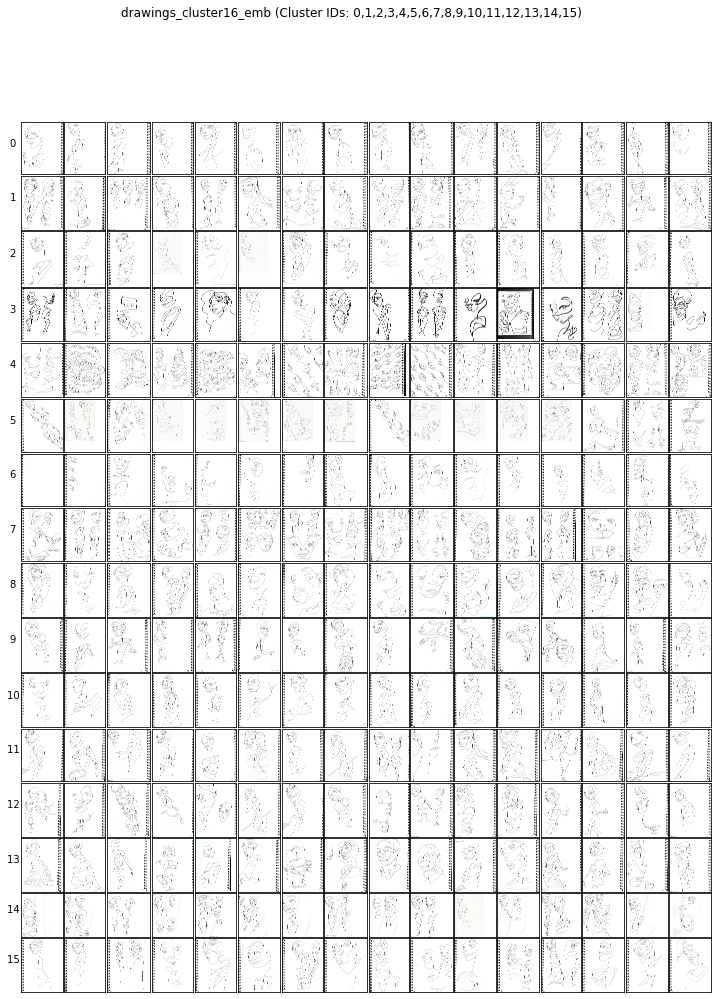

In [ ]:
show_all_clusters(
    clusters_df=drawings_df,
    clusters=drawings_cluster16_I,
    title="drawings_cluster16_emb",
)

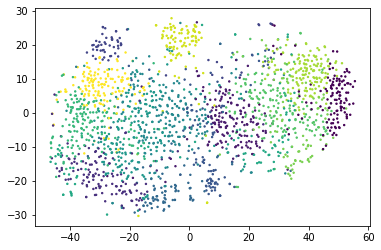

In [ ]:
fig = plt.scatter(
    x=drawings_X_tsne[:, 0],
    y=drawings_X_tsne[:, 1],
    c=drawings_df.drawings_cluster16_id,
    s=2.0,
)

#### drawings_cluster32

In [ ]:
ncentroids = 32
niter = 20
verbose = False
drawings_cluster32_kmeans = faiss.Kmeans(
    drawings_emb.shape[1], ncentroids, niter=niter, verbose=verbose, gpu=True
)
drawings_cluster32_kmeans.train(drawings_emb)
drawings_cluster32_D, drawings_cluster32_I = drawings_index.search(
    drawings_cluster32_kmeans.centroids, 16
)

drawings_cluster32_kD, drawings_cluster32_kI = drawings_cluster32_kmeans.index.search(
    drawings_emb, 1
)
drawings_df.loc[:, "drawings_cluster32_id"] = drawings_cluster32_kI
drawings_df.loc[:, "drawings_cluster32_dist"] = drawings_cluster32_kD
drawings_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped,drawings_cluster_id,drawings_cluster_dist,drawings_cropped_cluster_id,drawings_cropped_cluster_dist,drawings_cluster32_id,drawings_cluster32_dist
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,False,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb77p043.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb77p043.jpg,"-0.6198182,-0.5714155,0.2937309,0.2691822,-0.6254566,-0.46855158,-0.7267234,-0.4896673,-0.7537334,-0.42715576,2.241211,-0.013144195,-0.30681813,-0.6266761,0.43516117,-0.57515705,-0.5467274,-0.5245168,1.3334948,2.1400952,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.6690378,0.38178188,-0.5982413,-0.50063276,-0.21540937,0.4948988,-0.67007643,-0.52171326,-0.4592305,1.8570362,-0.6186755,0.94023055,-0.57338566,0.5270257,-0.6179389,2.302543,1.1004333,0.15528035,-0.6682474,1.890626,-0.59257406,1.331521,-0.6001429,1.5220151,0.93749076,-0.59497476,-0.66552746,-0.6482407,-0.4732165,0....",3,217.249588,5,332.983734,15,166.716202
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/0_drawings/sb67p021.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/0_drawings/sb67p021.jpg,"-0.20756221,-0.24843562,0.29454154,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,0.9697293,-0.72562873,-0.662768,-0.6266761,-0.23836556,0.4814458,-0.5467274,-0.6520286,0.838902,-0.6497359,-0.57338166,-0.55193967,-0.5446661,-0.28419846,1.6012006,-0.6690378,-0.4518578,-0.0104218125,-0.73986673,-0.3002332,-0.68509877,-0.67007643,-0.36297536,-0.4592305,-0.600525,-0.6186755,-0.73933,-0.57338566,-0.65925777,1.6904012,-0.61049384,-0.58021957,0.508085,0.14767355,0.8082305,-0.59257406,-0.6157326,-0.6001429,-0.651804,-0.30467254,0.17396247,-0.66552746,-0.6482407,-0.0...",2,169.947693,5,126.699768,18,137.920044
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3776337,-0.5714155,-0.2587232,-0.6553513,1.3532461,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.25077122,0.050992966,-0.72562873,0.1406585,-0.6266761,1.0653365,0.96198404,-0.5467274,0.30261123,0.6327609,-0.6497359,-0.64108604,-0.28434965

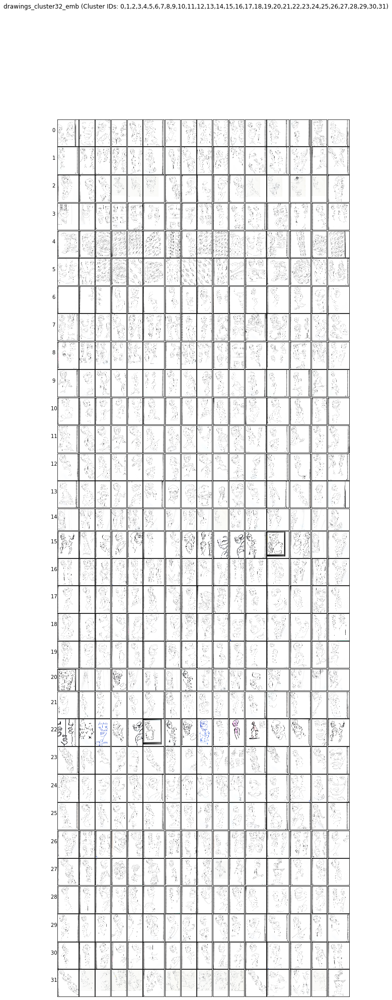

In [ ]:
show_all_clusters(
    clusters_df=drawings_df,
    clusters=drawings_cluster32_I,
    title="drawings_cluster32_emb",
)

In [ ]:
fig = plt.scatter(
    x=drawings_X_tsne[:, 0],
    y=drawings_X_tsne[:, 1],
    c=drawings_df.drawings_cluster32_id,
    s=2.0,
)

#### drawings_cluster48

In [ ]:
ncentroids = 48
niter = 20
verbose = False
drawings_cluster48_kmeans = faiss.Kmeans(
    drawings_emb.shape[1], ncentroids, niter=niter, verbose=verbose, gpu=True
)
drawings_cluster48_kmeans.train(drawings_emb)
drawings_cluster48_D, drawings_cluster48_I = drawings_index.search(
    drawings_cluster48_kmeans.centroids, 16
)

drawings_cluster48_kD, drawings_cluster48_kI = drawings_cluster48_kmeans.index.search(
    drawings_emb, 1
)
drawings_df.loc[:, "drawings_cluster48_id"] = drawings_cluster48_kI
drawings_df.loc[:, "drawings_cluster48_dist"] = drawings_cluster48_kD
drawings_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,drawings_cropped_cluster_id,drawings_cropped_cluster_dist,drawings_cluster32_id,drawings_cluster32_dist,drawings_cluster16_id,drawings_cluster16_dist,drawings_cluster64_id,drawings_cluster64_dist,drawings_cluster48_id,drawings_cluster48_dist
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,5,332.983734,15,166.716202,3,169.585052,58,145.230499,15,166.337051
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,5,126.699768,18,137.920044,8,141.980621,45,136.906982,45,137.201172
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3776337,-0.5714155,-0.2587232,-0.6553513,1.3532461,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.25077122,0.050992966,-0.72562873,0.1406585,-0.6266761,1.0653365,0.96198404,-0.5467274,0.30261123,0.6327609,-0.6497359,-0.64108604,-0.28434965,-0.35651857,-0.6779002,-0.28245115,-0.6690378,-0.4518578,0.030088186,-0.73986673,-0.18931103,-0.041653574,-0.67007643,-0.52171326,-0.29881266,-0.600525,-0.23231092,-0.73933,-0.57338566,-0.65925777,1.8833572,-0.61049384,0.44560486,0.14075392,-0.6682474,-0.75794554,-0.59257406,-0.07511848,-0.6001429,-0.651804,-0.5315948,0.023931146,0.723624,-0.6482407,-...",8,188.58075,0,...,5,257.762512,8,154.434723,14,161.993011,61,150.458466,8,148.634705
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb48p057.jpg,art/sb48p057.jpg,art,xtra,4,"0.165322,0.008453,0.008010,0.016587,0.801628","2.4936543,0.17563903,-0.6522293,-0.55642915,1.1084181,-0.5028205,-0.046447277,-0.4896673,-0.7537334,-0.42715576,0.84124434,-0.72562873,-0.52445275,-0.5557985,-0.21369287,2.2372599,-0.26381853,-0.6520286,-0.6898426,-0.6497359,-0.64108604,0.43080842,-0.23286673,-0.6779002,0.7969176,-0.6690378,-0.4518578,0.747658,0.04896885,-0.45211998,-0.68509877,-0.2462106,0.7319356,-0.4592305,-0.600525,-0.6186755,-0.5338096,-0.57338566,1.1886733,0.04046011,-0.61049384,0.45326668,0.72983754,-0.6682474,-0.10000485,0.034278154,-0.33160114,-0.6001429,-0.651804,-0.5315948,-0.20898154,-0.66552746,1.2346795,-0.47...",14,90.26291,0,...,2,145.937225,28,85.081177,15,92.158417,28,87.053833,28,83.963623
4,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p044.jpg,art/sb77p044.jpg,art,xtra,4,"0.171638,0.008182,0.008061,0.016469,0.795650","2.170152,-0.01916939,-0.47766963,-0.6553513,-0.44795185,-0.65341413,1.5596724,-0.4896673,-0.7537334,-0.4271557

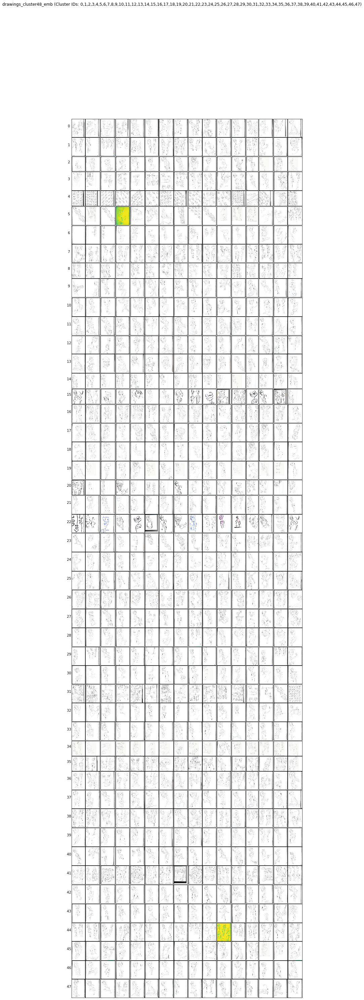

In [ ]:
show_all_clusters(
    clusters_df=drawings_df,
    clusters=drawings_cluster48_I,
    title="drawings_cluster48_emb",
)

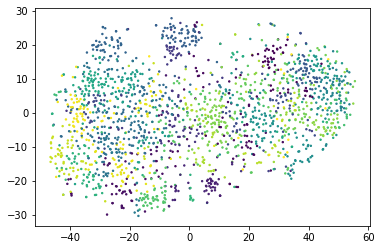

In [ ]:
fig = plt.scatter(
    x=drawings_X_tsne[:, 0],
    y=drawings_X_tsne[:, 1],
    c=drawings_df.drawings_cluster48_id,
    s=2.0,
)

#### drawings_cluster64

In [ ]:
ncentroids = 64
niter = 20
verbose = False
drawings_cluster64_kmeans = faiss.Kmeans(
    drawings_emb.shape[1], ncentroids, niter=niter, verbose=verbose, gpu=True
)
drawings_cluster64_kmeans.train(drawings_emb)
drawings_cluster64_D, drawings_cluster64_I = drawings_index.search(
    drawings_cluster64_kmeans.centroids, 16
)

drawings_cluster64_kD, drawings_cluster64_kI = drawings_cluster64_kmeans.index.search(
    drawings_emb, 1
)
drawings_df.loc[:, "drawings_cluster64_id"] = drawings_cluster64_kI
drawings_df.loc[:, "drawings_cluster64_dist"] = drawings_cluster64_kD
drawings_df.head()

WARNING clustering 1923 points to 64 centroids: please provide at least 2496 training points


,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,drawings_cluster_id,drawings_cluster_dist,drawings_cropped_cluster_id,drawings_cropped_cluster_dist,drawings_cluster32_id,drawings_cluster32_dist,drawings_cluster16_id,drawings_cluster16_dist,drawings_cluster64_id,drawings_cluster64_dist
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,3,217.249588,5,332.983734,15,166.716202,3,169.585052,58,145.230499
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,2,169.947693,5,126.699768,18,137.920044,8,141.980621,45,136.906982
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3776337,-0.5714155,-0.2587232,-0.6553513,1.3532461,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.25077122,0.050992966,-0.72562873,0.1406585,-0.6266761,1.0653365,0.96198404,-0.5467274,0.30261123,0.6327609,-0.6497359,-0.64108604,-0.28434965,-0.35651857,-0.6779002,-0.28245115,-0.6690378,-0.4518578,0.030088186,-0.73986673,-0.18931103,-0.041653574,-0.67007643,-0.52171326,-0.29881266,-0.600525,-0.23231092,-0.73933,-0.57338566,-0.65925777,1.8833572,-0.61049384,0.44560486,0.14075392,-0.6682474,-0.75794554,-0.59257406,-0.07511848,-0.6001429,-0.651804,-0.5315948,0.023931146,0.723624,-0.6482407,-...",8,188.58075,0,...,3,162.882431,5,257.762512,8,154.434723,14,161.993011,61,150.458466
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb48p057.jpg,art/sb48p057.jpg,art,xtra,4,"0.165322,0.008453,0.008010,0.016587,0.801628","2.4936543,0.17563903,-0.6522293,-0.55642915,1.1084181,-0.5028205,-0.046447277,-0.4896673,-0.7537334,-0.42715576,0.84124434,-0.72562873,-0.52445275,-0.5557985,-0.21369287,2.2372599,-0.26381853,-0.6520286,-0.6898426,-0.6497359,-0.64108604,0.43080842,-0.23286673,-0.6779002,0.7969176,-0.6690378,-0.4518578,0.747658,0.04896885,-0.45211998,-0.68509877,-0.2462106,0.7319356,-0.4592305,-0.600525,-0.6186755,-0.5338096,-0.57338566,1.1886733,0.04046011,-0.61049384,0.45326668,0.72983754,-0.6682474,-0.10000485,0.034278154,-0.33160114,-0.6001429,-0.651804,-0.5315948,-0.20898154,-0.66552746,1.2346795,-0.47...",14,90.26291,0,...,4,94.257965,2,145.937225,28,85.081177,15,92.158417,28,87.053833
4,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p044.jpg,art/sb77p044.jpg,art,xtra,4,"0.171638,0.008182,0.008061,0.016469,0.795650","2.170152,-0.01916939,-0.47766963,-0.6553513,-0.44795185,-0.65341413,1.5596724,-0.4896673,-0.7537334,-0.42715576,1.067

In [ ]:
# show_all_clusters(
#     clusters_df=drawings_df,
#     clusters=drawings_cluster64_I,
#     title="drawings_cluster64_emb",
# )

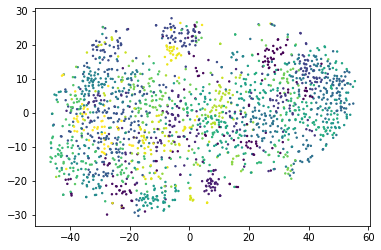

In [ ]:
fig = plt.scatter(
    x=drawings_X_tsne[:, 0],
    y=drawings_X_tsne[:, 1],
    c=drawings_df.drawings_cluster64_id,
    s=2.0,
)

### drawings_cropped variations

#### drawings_cropped_cluster16

In [ ]:
ncentroids = 16
niter = 20
verbose = False
drawings_cropped_cluster16_kmeans = faiss.Kmeans(
    drawings_cropped_emb.shape[1], ncentroids, niter=niter, verbose=verbose, gpu=True
)
drawings_cropped_cluster16_kmeans.train(drawings_cropped_emb)
(
    drawings_cropped_cluster16_D,
    drawings_cropped_cluster16_I,
) = drawings_cropped_index.search(drawings_cropped_cluster16_kmeans.centroids, 16)

(
    drawings_cropped_cluster16_kD,
    drawings_cropped_cluster16_kI,
) = drawings_cropped_cluster16_kmeans.index.search(drawings_cropped_emb, 1)
drawings_df.loc[:, "drawings_cropped_cluster16_id"] = drawings_cropped_cluster16_kI
drawings_df.loc[:, "drawings_cropped_cluster16_dist"] = drawings_cropped_cluster16_kD
drawings_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,drawings_cluster32_id,drawings_cluster32_dist,drawings_cluster16_id,drawings_cluster16_dist,drawings_cluster64_id,drawings_cluster64_dist,drawings_cluster48_id,drawings_cluster48_dist,drawings_cropped_cluster16_id,drawings_cropped_cluster16_dist
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,15,166.716202,3,169.585052,58,145.230499,15,166.337051,15,265.844086
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,18,137.920044,8,141.980621,45,136.906982,45,137.201172,14,121.146545
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3776337,-0.5714155,-0.2587232,-0.6553513,1.3532461,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.25077122,0.050992966,-0.72562873,0.1406585,-0.6266761,1.0653365,0.96198404,-0.5467274,0.30261123,0.6327609,-0.6497359,-0.64108604,-0.28434965,-0.35651857,-0.6779002,-0.28245115,-0.6690378,-0.4518578,0.030088186,-0.73986673,-0.18931103,-0.041653574,-0.67007643,-0.52171326,-0.29881266,-0.600525,-0.23231092,-0.73933,-0.57338566,-0.65925777,1.8833572,-0.61049384,0.44560486,0.14075392,-0.6682474,-0.75794554,-0.59257406,-0.07511848,-0.6001429,-0.651804,-0.5315948,0.023931146,0.723624,-0.6482407,-...",8,188.58075,0,...,8,154.434723,14,161.993011,61,150.458466,8,148.634705,10,220.298950
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb48p057.jpg,art/sb48p057.jpg,art,xtra,4,"0.165322,0.008453,0.008010,0.016587,0.801628","2.4936543,0.17563903,-0.6522293,-0.55642915,1.1084181,-0.5028205,-0.046447277,-0.4896673,-0.7537334,-0.42715576,0.84124434,-0.72562873,-0.52445275,-0.5557985,-0.21369287,2.2372599,-0.26381853,-0.6520286,-0.6898426,-0.6497359,-0.64108604,0.43080842,-0.23286673,-0.6779002,0.7969176,-0.6690378,-0.4518578,0.747658,0.04896885,-0.45211998,-0.68509877,-0.2462106,0.7319356,-0.4592305,-0.600525,-0.6186755,-0.5338096,-0.57338566,1.1886733,0.04046011,-0.61049384,0.45326668,0.72983754,-0.6682474,-0.10000485,0.034278154,-0.33160114,-0.6001429,-0.651804,-0.5315948,-0.20898154,-0.66552746,1.2346795,-0.47...",14,90.26291,0,...,28,85.081177,15,92.158417,28,87.053833,28,83.963623,2,144.254028
4,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p044.jpg,art/sb77p044.jpg,art,xtra,4,"0.171638,0.008182,0.008061,0.016469,0.795650","2.170152,-0.01916939,-0.47766963,-0.6553513,-0.44795185,-0.65341413,1.5596724,-0.4896673,-0.7537334,-0.

In [ ]:
# show_all_clusters(
#     clusters_df=drawings_df,
#     clusters=drawings_cropped_cluster16_I,
#     title="drawings_cropped_cluster16_emb",
# )

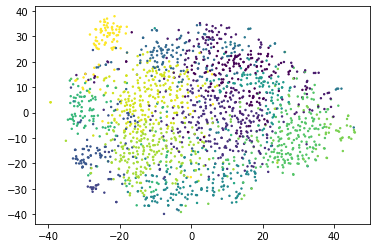

In [ ]:
fig = plt.scatter(
    x=drawings_cropped_X_tsne[:, 0],
    y=drawings_cropped_X_tsne[:, 1],
    c=drawings_df.drawings_cropped_cluster16_id,
    s=2.0,
)

#### drawings_cropped_cluster32

In [ ]:
ncentroids = 32
niter = 20
verbose = False
drawings_cropped_cluster32_kmeans = faiss.Kmeans(
    drawings_cropped_emb.shape[1], ncentroids, niter=niter, verbose=verbose, gpu=True
)
drawings_cropped_cluster32_kmeans.train(drawings_cropped_emb)
(
    drawings_cropped_cluster32_D,
    drawings_cropped_cluster32_I,
) = drawings_cropped_index.search(drawings_cropped_cluster32_kmeans.centroids, 16)

(
    drawings_cropped_cluster32_kD,
    drawings_cropped_cluster32_kI,
) = drawings_cropped_cluster32_kmeans.index.search(drawings_cropped_emb, 1)
drawings_df.loc[:, "drawings_cropped_cluster32_id"] = drawings_cropped_cluster32_kI
drawings_df.loc[:, "drawings_cropped_cluster32_dist"] = drawings_cropped_cluster32_kD
drawings_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,drawings_cluster16_id,drawings_cluster16_dist,drawings_cluster64_id,drawings_cluster64_dist,drawings_cluster48_id,drawings_cluster48_dist,drawings_cropped_cluster16_id,drawings_cropped_cluster16_dist,drawings_cropped_cluster32_id,drawings_cropped_cluster32_dist
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,3,169.585052,58,145.230499,15,166.337051,15,265.844086,15,257.350555
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,8,141.980621,45,136.906982,45,137.201172,14,121.146545,31,122.172424
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3776337,-0.5714155,-0.2587232,-0.6553513,1.3532461,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.25077122,0.050992966,-0.72562873,0.1406585,-0.6266761,1.0653365,0.96198404,-0.5467274,0.30261123,0.6327609,-0.6497359,-0.64108604,-0.28434965,-0.35651857,-0.6779002,-0.28245115,-0.6690378,-0.4518578,0.030088186,-0.73986673,-0.18931103,-0.041653574,-0.67007643,-0.52171326,-0.29881266,-0.600525,-0.23231092,-0.73933,-0.57338566,-0.65925777,1.8833572,-0.61049384,0.44560486,0.14075392,-0.6682474,-0.75794554,-0.59257406,-0.07511848,-0.6001429,-0.651804,-0.5315948,0.023931146,0.723624,-0.6482407,-...",8,188.58075,0,...,14,161.993011,61,150.458466,8,148.634705,10,220.298950,1,217.335358
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb48p057.jpg,art/sb48p057.jpg,art,xtra,4,"0.165322,0.008453,0.008010,0.016587,0.801628","2.4936543,0.17563903,-0.6522293,-0.55642915,1.1084181,-0.5028205,-0.046447277,-0.4896673,-0.7537334,-0.42715576,0.84124434,-0.72562873,-0.52445275,-0.5557985,-0.21369287,2.2372599,-0.26381853,-0.6520286,-0.6898426,-0.6497359,-0.64108604,0.43080842,-0.23286673,-0.6779002,0.7969176,-0.6690378,-0.4518578,0.747658,0.04896885,-0.45211998,-0.68509877,-0.2462106,0.7319356,-0.4592305,-0.600525,-0.6186755,-0.5338096,-0.57338566,1.1886733,0.04046011,-0.61049384,0.45326668,0.72983754,-0.6682474,-0.10000485,0.034278154,-0.33160114,-0.6001429,-0.651804,-0.5315948,-0.20898154,-0.66552746,1.2346795,-0.47...",14,90.26291,0,...,15,92.158417,28,87.053833,28,83.963623,2,144.254028,21,129.951965
4,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p044.jpg,art/sb77p044.jpg,art,xtra,4,"0.171638,0.008182,0.008061,0.016469,0.795650","2.170152,-0.01916939,-0.47766963,-0.6553513,-0.44795185,-0.65341413,1.5596724,-0.48966

In [ ]:
# show_all_clusters(
#     clusters_df=drawings_df,
#     clusters=drawings_cropped_cluster32_I,
#     title="drawings_cropped_cluster32_emb",
# )

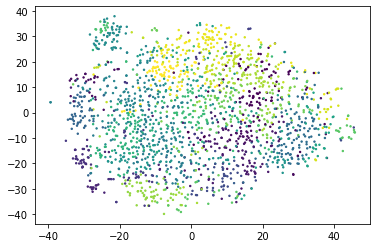

In [ ]:
fig = plt.scatter(
    x=drawings_cropped_X_tsne[:, 0],
    y=drawings_cropped_X_tsne[:, 1],
    c=drawings_df.drawings_cropped_cluster32_id,
    s=2.0,
)

#### drawings_cropped_cluster48

In [ ]:
ncentroids = 48
niter = 20
verbose = False
drawings_cropped_cluster48_kmeans = faiss.Kmeans(
    drawings_cropped_emb.shape[1], ncentroids, niter=niter, verbose=verbose, gpu=True
)
drawings_cropped_cluster48_kmeans.train(drawings_cropped_emb)
(
    drawings_cropped_cluster48_D,
    drawings_cropped_cluster48_I,
) = drawings_cropped_index.search(drawings_cropped_cluster48_kmeans.centroids, 16)

(
    drawings_cropped_cluster48_kD,
    drawings_cropped_cluster48_kI,
) = drawings_cropped_cluster48_kmeans.index.search(drawings_cropped_emb, 1)
drawings_df.loc[:, "drawings_cropped_cluster48_id"] = drawings_cropped_cluster48_kI
drawings_df.loc[:, "drawings_cropped_cluster48_dist"] = drawings_cropped_cluster48_kD
drawings_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,drawings_cluster64_id,drawings_cluster64_dist,drawings_cluster48_id,drawings_cluster48_dist,drawings_cropped_cluster16_id,drawings_cropped_cluster16_dist,drawings_cropped_cluster32_id,drawings_cropped_cluster32_dist,drawings_cropped_cluster48_id,drawings_cropped_cluster48_dist
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,58,145.230499,15,166.337051,15,265.844086,15,257.350555,15,268.672974
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,45,136.906982,45,137.201172,14,121.146545,31,122.172424,31,116.409210
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3776337,-0.5714155,-0.2587232,-0.6553513,1.3532461,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.25077122,0.050992966,-0.72562873,0.1406585,-0.6266761,1.0653365,0.96198404,-0.5467274,0.30261123,0.6327609,-0.6497359,-0.64108604,-0.28434965,-0.35651857,-0.6779002,-0.28245115,-0.6690378,-0.4518578,0.030088186,-0.73986673,-0.18931103,-0.041653574,-0.67007643,-0.52171326,-0.29881266,-0.600525,-0.23231092,-0.73933,-0.57338566,-0.65925777,1.8833572,-0.61049384,0.44560486,0.14075392,-0.6682474,-0.75794554,-0.59257406,-0.07511848,-0.6001429,-0.651804,-0.5315948,0.023931146,0.723624,-0.6482407,-...",8,188.58075,0,...,61,150.458466,8,148.634705,10,220.298950,1,217.335358,1,213.251678
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb48p057.jpg,art/sb48p057.jpg,art,xtra,4,"0.165322,0.008453,0.008010,0.016587,0.801628","2.4936543,0.17563903,-0.6522293,-0.55642915,1.1084181,-0.5028205,-0.046447277,-0.4896673,-0.7537334,-0.42715576,0.84124434,-0.72562873,-0.52445275,-0.5557985,-0.21369287,2.2372599,-0.26381853,-0.6520286,-0.6898426,-0.6497359,-0.64108604,0.43080842,-0.23286673,-0.6779002,0.7969176,-0.6690378,-0.4518578,0.747658,0.04896885,-0.45211998,-0.68509877,-0.2462106,0.7319356,-0.4592305,-0.600525,-0.6186755,-0.5338096,-0.57338566,1.1886733,0.04046011,-0.61049384,0.45326668,0.72983754,-0.6682474,-0.10000485,0.034278154,-0.33160114,-0.6001429,-0.651804,-0.5315948,-0.20898154,-0.66552746,1.2346795,-0.47...",14,90.26291,0,...,28,87.053833,28,83.963623,2,144.254028,21,129.951965,21,140.072540
4,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p044.jpg,art/sb77p044.jpg,art,xtra,4,"0.171638,0.008182,0.008061,0.016469,0.795650","2.170152,-0.01916939,-0.47766963,-0.6553513,-0.44795185,-0.65341413,

In [ ]:
# show_all_clusters(
#     clusters_df=drawings_df,
#     clusters=drawings_cropped_cluster48_I,
#     title="drawings_cropped_cluster48_emb",
# )

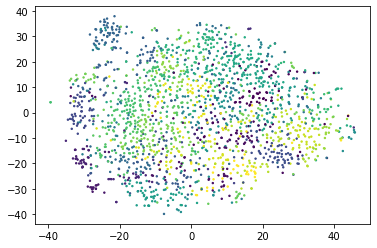

In [ ]:
fig = plt.scatter(
    x=drawings_cropped_X_tsne[:, 0],
    y=drawings_cropped_X_tsne[:, 1],
    c=drawings_df.drawings_cropped_cluster48_id,
    s=2.0,
)

#### drawings_cropped_cluster64

In [ ]:
ncentroids = 64
niter = 20
verbose = False
drawings_cropped_cluster64_kmeans = faiss.Kmeans(
    drawings_cropped_emb.shape[1], ncentroids, niter=niter, verbose=verbose, gpu=True
)
drawings_cropped_cluster64_kmeans.train(drawings_cropped_emb)
(
    drawings_cropped_cluster64_D,
    drawings_cropped_cluster64_I,
) = drawings_cropped_index.search(drawings_cropped_cluster64_kmeans.centroids, 16)

(
    drawings_cropped_cluster64_kD,
    drawings_cropped_cluster64_kI,
) = drawings_cropped_cluster64_kmeans.index.search(drawings_cropped_emb, 1)
drawings_df.loc[:, "drawings_cropped_cluster64_id"] = drawings_cropped_cluster64_kI
drawings_df.loc[:, "drawings_cropped_cluster64_dist"] = drawings_cropped_cluster64_kD
drawings_df.head()

WARNING clustering 1923 points to 64 centroids: please provide at least 2496 training points


,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,drawings_cluster48_id,drawings_cluster48_dist,drawings_cropped_cluster16_id,drawings_cropped_cluster16_dist,drawings_cropped_cluster32_id,drawings_cropped_cluster32_dist,drawings_cropped_cluster48_id,drawings_cropped_cluster48_dist,drawings_cropped_cluster64_id,drawings_cropped_cluster64_dist
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,15,166.337051,15,265.844086,15,257.350555,15,268.672974,58,276.820343
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,45,137.201172,14,121.146545,31,122.172424,31,116.409210,34,122.042419
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3776337,-0.5714155,-0.2587232,-0.6553513,1.3532461,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.25077122,0.050992966,-0.72562873,0.1406585,-0.6266761,1.0653365,0.96198404,-0.5467274,0.30261123,0.6327609,-0.6497359,-0.64108604,-0.28434965,-0.35651857,-0.6779002,-0.28245115,-0.6690378,-0.4518578,0.030088186,-0.73986673,-0.18931103,-0.041653574,-0.67007643,-0.52171326,-0.29881266,-0.600525,-0.23231092,-0.73933,-0.57338566,-0.65925777,1.8833572,-0.61049384,0.44560486,0.14075392,-0.6682474,-0.75794554,-0.59257406,-0.07511848,-0.6001429,-0.651804,-0.5315948,0.023931146,0.723624,-0.6482407,-...",8,188.58075,0,...,8,148.634705,10,220.298950,1,217.335358,1,213.251678,1,191.671631
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb48p057.jpg,art/sb48p057.jpg,art,xtra,4,"0.165322,0.008453,0.008010,0.016587,0.801628","2.4936543,0.17563903,-0.6522293,-0.55642915,1.1084181,-0.5028205,-0.046447277,-0.4896673,-0.7537334,-0.42715576,0.84124434,-0.72562873,-0.52445275,-0.5557985,-0.21369287,2.2372599,-0.26381853,-0.6520286,-0.6898426,-0.6497359,-0.64108604,0.43080842,-0.23286673,-0.6779002,0.7969176,-0.6690378,-0.4518578,0.747658,0.04896885,-0.45211998,-0.68509877,-0.2462106,0.7319356,-0.4592305,-0.600525,-0.6186755,-0.5338096,-0.57338566,1.1886733,0.04046011,-0.61049384,0.45326668,0.72983754,-0.6682474,-0.10000485,0.034278154,-0.33160114,-0.6001429,-0.651804,-0.5315948,-0.20898154,-0.66552746,1.2346795,-0.47...",14,90.26291,0,...,28,83.963623,2,144.254028,21,129.951965,21,140.072540,21,144.775696
4,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p044.jpg,art/sb77p044.jpg,art,xtra,4,"0.171638,0.008182,0.008061,0.016469,0.795650","2.170152,-0.01916939,-0.47766963,-0.6553513,-0.44795

In [ ]:
# show_all_clusters(
#     clusters_df=drawings_df,
#     clusters=drawings_cropped_cluster64_I,
#     title="drawings_cropped_cluster64_emb",
# )

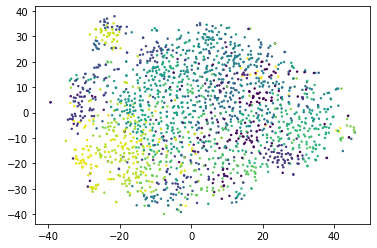

In [ ]:
fig = plt.scatter(
    x=drawings_cropped_X_tsne[:, 0],
    y=drawings_cropped_X_tsne[:, 1],
    c=drawings_df.drawings_cropped_cluster64_id,
    s=2.0,
)

## saving cluster outputs

### save the TSV's with cluster ID's

In [ ]:
preprocessing_dir

'/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP'

In [ ]:
subclusters_dir = (
    singleline_data_home() / "raster/epoch-20231214/04_SUBCLUSTERS"
)

if not os.path.isdir(subclusters_dir):
    os.makedirs(subclusters_dir)

In [ ]:
drawings_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,drawings_cluster48_id,drawings_cluster48_dist,drawings_cropped_cluster16_id,drawings_cropped_cluster16_dist,drawings_cropped_cluster32_id,drawings_cropped_cluster32_dist,drawings_cropped_cluster48_id,drawings_cropped_cluster48_dist,drawings_cropped_cluster64_id,drawings_cropped_cluster64_dist
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,15,166.337051,15,265.844086,15,257.350555,15,268.672974,58,276.820343
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,45,137.201172,14,121.146545,31,122.172424,31,116.409210,34,122.042419
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3776337,-0.5714155,-0.2587232,-0.6553513,1.3532461,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.25077122,0.050992966,-0.72562873,0.1406585,-0.6266761,1.0653365,0.96198404,-0.5467274,0.30261123,0.6327609,-0.6497359,-0.64108604,-0.28434965,-0.35651857,-0.6779002,-0.28245115,-0.6690378,-0.4518578,0.030088186,-0.73986673,-0.18931103,-0.041653574,-0.67007643,-0.52171326,-0.29881266,-0.600525,-0.23231092,-0.73933,-0.57338566,-0.65925777,1.8833572,-0.61049384,0.44560486,0.14075392,-0.6682474,-0.75794554,-0.59257406,-0.07511848,-0.6001429,-0.651804,-0.5315948,0.023931146,0.723624,-0.6482407,-...",8,188.58075,0,...,8,148.634705,10,220.298950,1,217.335358,1,213.251678,1,191.671631
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb48p057.jpg,art/sb48p057.jpg,art,xtra,4,"0.165322,0.008453,0.008010,0.016587,0.801628","2.4936543,0.17563903,-0.6522293,-0.55642915,1.1084181,-0.5028205,-0.046447277,-0.4896673,-0.7537334,-0.42715576,0.84124434,-0.72562873,-0.52445275,-0.5557985,-0.21369287,2.2372599,-0.26381853,-0.6520286,-0.6898426,-0.6497359,-0.64108604,0.43080842,-0.23286673,-0.6779002,0.7969176,-0.6690378,-0.4518578,0.747658,0.04896885,-0.45211998,-0.68509877,-0.2462106,0.7319356,-0.4592305,-0.600525,-0.6186755,-0.5338096,-0.57338566,1.1886733,0.04046011,-0.61049384,0.45326668,0.72983754,-0.6682474,-0.10000485,0.034278154,-0.33160114,-0.6001429,-0.651804,-0.5315948,-0.20898154,-0.66552746,1.2346795,-0.47...",14,90.26291,0,...,28,83.963623,2,144.254028,21,129.951965,21,140.072540,21,144.775696
4,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p044.jpg,art/sb77p044.jpg,art,xtra,4,"0.171638,0.008182,0.008061,0.016469,0.795650","2.170152,-0.01916939,-0.47766963,-0.6553513,-0.44795

In [ ]:
clustered_drawings_tsv_fname = f"{subclusters_dir}/clustered_drawings.tsv"
drawings_df.to_csv(
    clustered_drawings_tsv_fname, index=True, index_label="idx", sep="\t", header=True
)
clustered_drawings_df = pd.read_csv(
    clustered_drawings_tsv_fname, delimiter="\t", index_col="idx"
)
clustered_drawings_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,drawings_cluster48_id,drawings_cluster48_dist,drawings_cropped_cluster16_id,drawings_cropped_cluster16_dist,drawings_cropped_cluster32_id,drawings_cropped_cluster32_dist,drawings_cropped_cluster48_id,drawings_cropped_cluster48_dist,drawings_cropped_cluster64_id,drawings_cropped_cluster64_dist
idx,,,,,,,,,,,,,,,,,,,,,
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p043.jpg,art/sb77p043.jpg,art,xtra,4,"0.168532,0.008473,0.008068,0.016940,0.797986","-0.6198182,-0.5714155,-0.6871516,-0.6553513,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.42715576,1.4904574,-0.72562873,-0.662768,-0.6266761,0.6913696,0.054546177,-0.5467274,-0.6520286,0.117179275,0.94330966,0.5815062,-0.55193967,-0.5446661,-0.6779002,-0.57759243,-0.4584825,-0.3818994,-0.5750927,-0.73986673,-0.45211998,-0.6141643,-0.67007643,-0.52171326,-0.4592305,1.4788612,-0.6186755,0.799198,-0.57338566,-0.17778617,0.10336053,0.093812525,0.17924881,-0.6189488,-0.6682474,2.1040225,-0.59257406,1.6553459,-0.6001429,0.5109105,0.19352531,-0.2517513,-0.66552746,-0.6482407,-0.4732...",11,199.22961,1,...,15,166.33705,15,265.844100,15,257.350560,15,268.67297,58,276.82034
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb67p021.jpg,art/sb67p021.jpg,art,xtra,4,"0.170976,0.008673,0.008480,0.017028,0.794843","1.1073987,0.3512016,-0.73929733,-0.6553513,1.7477593,-0.65341413,0.32179314,-0.4896673,-0.1797334,-0.42715576,1.3163843,-0.72562873,-0.61387855,-0.6266761,-0.35361218,0.37611246,-0.08771938,-0.5262803,0.9261699,-0.6497359,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.32559583,-0.6690378,-0.4518578,0.51828945,-0.4238917,-0.45211998,-0.16527033,-0.67007643,1.0136865,-0.4592305,-0.600525,-0.060860336,-0.19446748,-0.24127388,2.2282472,1.8003348,-0.61049384,0.39795423,0.2626753,-0.6682474,-0.75794554,-0.59257406,0.80257696,-0.6001429,-0.651804,-0.028328001,0.53641737,-0.6501347,-0.6482407,0....",3,132.26111,0,...,45,137.20117,14,121.146545,31,122.172424,31,116.40921,34,122.04242
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb25p227.jpg,art/sb25p227.jpg,art,xtra,4,"0.158396,0.008277,0.007424,0.016584,0.809319","1.3776337,-0.5714155,-0.2587232,-0.6553513,1.3532461,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.25077122,0.050992966,-0.72562873,0.1406585,-0.6266761,1.0653365,0.96198404,-0.5467274,0.30261123,0.6327609,-0.6497359,-0.64108604,-0.28434965,-0.35651857,-0.6779002,-0.28245115,-0.6690378,-0.4518578,0.030088186,-0.73986673,-0.18931103,-0.041653574,-0.67007643,-0.52171326,-0.29881266,-0.600525,-0.23231092,-0.73933,-0.57338566,-0.65925777,1.8833572,-0.61049384,0.44560486,0.14075392,-0.6682474,-0.75794554,-0.59257406,-0.07511848,-0.6001429,-0.651804,-0.5315948,0.023931146,0.723624,-0.6482407,-...",8,188.58075,0,...,8,148.63470,10,220.298950,1,217.335360,1,213.25168,1,191.67163
3,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb48p057.jpg,art/sb48p057.jpg,art,xtra,4,"0.165322,0.008453,0.008010,0.016587,0.801628","2.4936543,0.17563903,-0.6522293,-0.55642915,1.1084181,-0.5028205,-0.046447277,-0.4896673,-0.7537334,-0.42715576,0.84124434,-0.72562873,-0.52445275,-0.5557985,-0.21369287,2.2372599,-0.26381853,-0.6520286,-0.6898426,-0.6497359,-0.64108604,0.43080842,-0.23286673,-0.6779002,0.7969176,-0.6690378,-0.4518578,0.747658,0.04896885,-0.45211998,-0.68509877,-0.2462106,0.7319356,-0.4592305,-0.600525,-0.6186755,-0.5338096,-0.57338566,1.1886733,0.04046011,-0.61049384,0.45326668,0.72983754,-0.6682474,-0.10000485,0.034278154,-0.33160114,-0.6001429,-0.651804,-0.5315948,-0.20898154,-0.66552746,1.2346795,-0.47...",14,90.26291,0,...,28,83.96362,2,144.254030,21,129.951970,21,140.07254,21,144.77570
4,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb77p044.jpg,art/sb77p044.jpg,art,xtra,4,"0.171638,0.008182,0.008061,0.016469,0.795650","2.170152,-0.01916939,-0.47766963,-0.655

In [ ]:
clustered_watercolors_tsv_fname = f"{subclusters_dir}/clustered_watercolors.tsv"
watercolors_df.to_csv(
    clustered_watercolors_tsv_fname,
    index=True,
    index_label="idx",
    sep="\t",
    header=True,
)
clustered_watercolors_df = pd.read_csv(
    clustered_watercolors_tsv_fname, delimiter="\t", index_col="idx"
)
clustered_watercolors_df.head()

,abs_fname,rel_fname,label,pred_label,pred_idx,pred_probs,emb_csv,cluster,cluster_dist,metacluster,...,handlabeled_metacluster_name,handlabeled_metacluster_id,handlabeled_metacluster_was_correct,preprocessed_abs_path,handlabeled_abs_path,emb_csv_cropped,watercolors_cluster_id,watercolors_cluster_dist,watercolors_cropped_cluster_id,watercolors_cropped_cluster_dist
idx,,,,,,,,,,,,,,,,,,,,,
0,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb07p104.jpg,art/sb07p104.jpg,art,xtra,4,"0.177406,0.008799,0.008245,0.017177,0.788373","-0.39105213,0.96309596,-0.73929733,0.4489988,0.8297614,-0.3937308,-0.7267234,-0.32461396,-0.7537334,-0.42715576,-0.62038505,-0.72562873,0.3037846,-0.6266761,-0.5213815,-0.31669965,-0.5467274,-0.6520286,-0.22544897,-0.6497359,-0.64108604,0.6374447,-0.5446661,-0.6779002,-0.14143991,-0.6690378,-0.44753593,0.66945183,-0.73986673,-0.45211998,-0.05996394,-0.21525535,0.82928157,-0.04412651,-0.600525,-0.04148197,-0.73825717,-0.57338566,-0.25227422,2.3566113,-0.61049384,1.0027854,-0.40134108,1.3733256,-0.75794554,-0.59257406,-0.4395525,-0.6001429,1.0358506,1.1911299,0.8162154,0.032713354,-0.6482407...",5,238.33170,1,...,1_watercolors,1,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/1_watercolors/sb07p104.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/1_watercolors/sb07p104.jpg,"-0.6198182,0.8895926,-0.73929733,0.6418346,0.46164584,1.0085131,-0.7267234,-0.4896673,-0.7537334,-0.42715576,-0.62038505,-0.72562873,1.4399182,-0.6266761,0.474914,-0.57515705,-0.5467274,-0.6520286,1.2274435,-0.6497359,-0.27622125,-0.45870692,-0.5446661,-0.6779002,1.3343718,-0.6690378,-0.4518578,0.42277813,-0.73986673,-0.45211998,1.6291834,-0.67007643,-0.09817025,-0.00090405345,-0.600525,-0.6186755,-0.73933,-0.57338566,0.006386578,1.034553,-0.61049384,-0.58021957,-0.09483403,0.78779536,-0.73080033,0.10947651,0.3367887,-0.5382227,-0.26548737,0.5630663,2.15088,0.2266624,-0.6482407,0.049348265...",7,215.02927,7,206.64117
1,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb31p017.jpg,art/sb31p017.jpg,art,xtra,4,"0.172119,0.008924,0.008226,0.016950,0.793781","-0.05104202,-0.3935787,-0.73929733,0.86878717,-0.6254566,-0.65341413,-0.7267234,-0.4896673,-0.7537334,-0.14799604,-0.62038505,-0.72562873,-0.2654881,-0.6266761,-0.68991846,-0.57515705,-0.41532665,-0.6520286,-0.6898426,-0.34099144,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.2674706,-0.53598946,-0.13334358,-0.5982413,-0.73986673,-0.45211998,-0.68509877,0.033780396,-0.52171326,0.054827005,-0.20721096,0.3301326,-0.73933,-0.57338566,0.34032136,-0.6179389,-0.20170414,0.16225064,-0.44437563,0.44581896,-0.069196045,0.20976627,-0.07846111,-0.6001429,0.38122594,-0.09738222,-0.59497476,-0.665527...",11,191.66959,1,...,1_watercolors,1,True,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/10_SIMPLE_CROP/1_watercolors/sb31p017.jpg,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/03_VISUAL_HAND_LABELED/1_watercolors/sb31p017.jpg,"1.491735,-0.5714155,-0.73929733,0.05867392,0.5154146,0.0936929,-0.7267234,-0.4896673,0.4246894,-0.42715576,-0.33477074,-0.72562873,1.2274611,-0.6266761,-0.68991846,-0.57515705,-0.5467274,1.1312869,-0.06054777,-0.028933167,-0.64108604,-0.55193967,-0.5446661,-0.6779002,-0.57759243,0.46393585,0.4817328,0.22738433,-0.73986673,-0.45211998,0.0057709217,-0.67007643,-0.52171326,0.68283725,0.060967267,0.7253895,-0.73933,-0.57338566,-0.65925777,-0.6179389,-0.32987997,0.86336035,-0.6189488,1.3613329,1.2250904,-0.59257406,-0.5857397,-0.6001429,-0.5687719,-0.14814761,0.5325973,-0.66552746,-0.6482407,0....",4,199.03098,4,195.97546
2,/Users/al/Dropbox/2-Areas/2-Sketchbooks/datasets/full-v2/01_FLAT/art/sb05p079.jpg,art/sb05p079.jpg,art,xtra,4,"0.172158,0.008873,0.008536,0.017017,0.793416","1.8089037,-0.5714155,-0.73929733,-0.10773122,-0.22753507,0.34884918,0.124596715,-0.4896673,-0.27447522,-0.42715576,0.61659455,-0.03226477,-0.662768,-0.6266761,-0.68991846,-0.57515705,-

In [ ]:
drawing_centroids = {
    "drawings_emdb": {
        "drawings_cluster8": (drawings_D.tolist(), drawings_I.tolist()),
        "drawings_cluster16": (
            drawings_cluster16_D.tolist(),
            drawings_cluster16_I.tolist(),
        ),
        "drawings_cluster32": (
            drawings_cluster32_D.tolist(),
            drawings_cluster32_I.tolist(),
        ),
        "drawings_cluster48": (
            drawings_cluster48_D.tolist(),
            drawings_cluster48_I.tolist(),
        ),
        "drawings_cluster64": (
            drawings_cluster64_D.tolist(),
            drawings_cluster64_I.tolist(),
        ),
    },
    "drawings_cropped_emdb": {
        "drawings_cropped_cluster8": (
            drawings_cropped_D.tolist(),
            drawings_cropped_I.tolist(),
        ),
        "drawings_cropped_cluster16": (
            drawings_cropped_cluster16_D.tolist(),
            drawings_cropped_cluster16_I.tolist(),
        ),
        "drawings_cropped_cluster32": (
            drawings_cropped_cluster32_D.tolist(),
            drawings_cropped_cluster32_I.tolist(),
        ),
        "drawings_cropped_cluster48": (
            drawings_cropped_cluster48_D.tolist(),
            drawings_cropped_cluster48_I.tolist(),
        ),
        "drawings_cropped_cluster64": (
            drawings_cropped_cluster64_D.tolist(),
            drawings_cropped_cluster64_I.tolist(),
        ),
    },
}

In [ ]:
# see also: https://github.com/facebookresearch/faiss/issues/2087
drawing_centroids_fname = f"{subclusters_dir}/centroids_drawings.json"
with open(drawing_centroids_fname, "w") as outfile:
    json.dump(drawing_centroids, outfile, indent=2)

In [ ]:
watercolor_centroids = {
    "watercolors_emdb": {
        "drawings_cluster8": (watercolors_D.tolist(), watercolors_I.tolist()),
    },
    "watercolors_cropped_emdb": {
        "drawings_cropped_cluster8": (
            watercolors_cropped_D.tolist(),
            watercolors_cropped_I.tolist(),
        ),
    },
}

In [ ]:
watercolor_centroids_fname = f"{subclusters_dir}/centroids_watercolors.json"
with open(watercolor_centroids_fname, "w") as outfile:
    json.dump(watercolor_centroids, outfile, indent=2)

In [ ]:
from pprint import pprint

pprint(watercolor_centroids)

In [ ]:
# finish saving

In [ ]:
#| hide
import nbdev

nbdev.nbdev_export()